## Imports

In [1]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np
import math

## Plot and Scatter fnc

In [2]:
def draw_data(ax, x, start=0, end=None, label='x', title=None, marker='o', size=1, kind='scatter'):
    """
    Scatter plot x over time in a given axis.
    
    Parameters:
        ax : matplotlib axis object
        x : numpy array to plot
        start, end : interval of indices
        label : y-axis label
        title : subplot title
        marker : style of points
        size : size of points
    """
    if end is None:
        end = len(x)
    
    if kind == 'scatter':
        ax.scatter(range(end-start), x[start:end], marker=marker, s=size)
    elif kind == 'plot':
        ax.plot(range(end-start), x[start:end])
    else:
        raise ValueError("kind doit être 'scatter' ou 'plot'")
    
    ax.set_ylabel(label)
    if title is None:
        title = f'{label} ({end-start} valeurs)'
    ax.set_title(title)
    ax.grid(True)

def draw_data1(x, start=0, end=None, label='x', title=None, marker='o', size=1, kind='plot'):
    fig, ax = plt.subplots(figsize=(15, 4))
    draw_data(ax, x, start=start, end=end, label=label, title=title, marker=marker, size=size, kind=kind)
    ax.set_xlabel('Index')
    plt.tight_layout()
    plt.show()

def draw_data2(x,y, start=0, end=None, label_x='x', label_y='y', size=1, kind='plot'):
    fig, axes = plt.subplots(2, 1, figsize=(15, 6))
    draw_data(axes[0], x, start=start, end=end, label=label_x, size=size, kind=kind)
    draw_data(axes[1], y, start=start, end=end, label=label_y, size=size, kind=kind)
    axes[1].set_xlabel('Index')
    plt.tight_layout()
    plt.show()

def draw_data3(x,y,z, start=0, end=None, label_x='x', label_y='y', label_z='z', size=1, kind='plot'):
    fig, axes = plt.subplots(3, 1, figsize=(15, 9))
    draw_data(axes[0], x, start=start, end=end, label=label_x, size=size, kind=kind)
    draw_data(axes[1], y, start=start, end=end, label=label_y, size=size, kind=kind)
    draw_data(axes[2], z, start=start, end=end, label=label_z, size=size, kind=kind)
    axes[2].set_xlabel('Index')
    plt.tight_layout()
    plt.show()

def draw_data4(w,x,y,z, start=0, end=None, label_w='w', label_x='x', label_y='y', label_z='z', size=1, kind='plot'):
    fig, axes = plt.subplots(4, 1, figsize=(15, 12))
    draw_data(axes[0], w, start=start, end=end, label=label_w, size=size, kind=kind)
    draw_data(axes[1], x, start=start, end=end, label=label_x, size=size, kind=kind)
    draw_data(axes[2], y, start=start, end=end, label=label_y, size=size, kind=kind)
    draw_data(axes[3], z, start=start, end=end, label=label_z, size=size, kind=kind)
    axes[3].set_xlabel('Index')
    plt.tight_layout()
    plt.show()

In [98]:
def compare_data(x, y, start=0, end=None, xlabel='x', ylabel='y', title=None, marker='o', size=1, kind='plot'):
    """
    Plot y versus x for a given interval.
    
    Parameters:
        x, y : numpy arrays to plot
        start : index de début (inclus)
        end : index de fin (exclus), None pour la fin du tableau
        xlabel, ylabel : labels des axes
        title : titre du graphique, None pour générer automatiquement
        marker : style des points
    """
    if end is None:
        end = len(x)

    plt.figure(figsize=(15, 10))

    if kind == 'plot':
        plt.plot(x[start:end], y[start:end], marker=marker)
    elif kind == 'scatter':
        plt.scatter(x[start:end], y[start:end], marker=marker, s=size)
    else:
        raise ValueError(f"Unknown kind: {kind}")

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    if title is None:
        title = f'{ylabel} en fonction de {xlabel} ({end-start} valeurs)'
    plt.title(title)
    
    plt.grid(True)
    plt.axis('equal')
    plt.show()

In [4]:
import matplotlib.pyplot as plt

def draw_same_plot(*arrays, start=0, end=None, labels=None, title=None, marker='o', size=1, kind='plot'):
    """
    Plot multiple arrays on the same figure.
    
    Parameters:
        *arrays : numpy arrays to plot
        start, end : interval of indices
        labels : list of labels for the legend
        title : plot title
        marker : marker style for scatter
        size : size of points
        kind : 'plot' or 'scatter'
    """
    if end is None:
        end = len(arrays[0])
    if labels is None:
        labels = [f'var{i}' for i in range(len(arrays))]
    
    fig, ax = plt.subplots(figsize=(15, 4))
    
    for i, x in enumerate(arrays):
        if kind == 'plot':
            ax.plot(range(end-start), x[start:end], label=labels[i])
        elif kind == 'scatter':
            ax.scatter(range(end-start), x[start:end], marker=marker, s=size, label=labels[i])
        else:
            raise ValueError("kind doit être 'scatter' ou 'plot'")
    
    ax.set_xlabel('Index')
    ax.set_ylabel('Value')
    ax.set_title(title if title is not None else "Multiple curves")
    ax.grid(True)
    ax.legend()
    plt.tight_layout()
    plt.show()


## Derivatives and EMA

In [66]:
def compute_derivatives(acc_magnitude, delta_t):
    derivs = [0]  # première dérivée nulle
    for i in range(1, len(acc_magnitude)):
        deriv = (acc_magnitude[i] - acc_magnitude[i - 1]) / delta_t[i]
        derivs.append(deriv)
    return derivs

def compute_centered_derivatives(acc_magnitude, delta_t):
    derivs = [0]  # première valeur neutre
    for i in range(1, len(acc_magnitude) - 1):
        dt = delta_t[i] + delta_t[i-1]
        deriv = (acc_magnitude[i+1] - acc_magnitude[i-1]) / dt
        derivs.append(deriv)
    derivs.append(0)  # pour garder la même longueur
    return derivs

def compute_ema(values, alpha):
    ema_list = [values[0]]  # première valeur = valeur initiale
    for i in range(1, len(values)):
        ema = alpha * values[i] + (1 - alpha) * ema_list[i - 1]
        ema_list.append(ema)
    return ema_list

## Integrations

In [6]:
def trapezoidal_integration(data_x, data_y, data_z, delta_t):
    N = len(data_x)
    integrated = np.zeros((N, 3))
    
    for i in range(1, N):
        integrated[i, 0] = integrated[i-1, 0] + 0.5 * (data_x[i] + data_x[i-1]) * delta_t[i]
        integrated[i, 1] = integrated[i-1, 1] + 0.5 * (data_y[i] + data_y[i-1]) * delta_t[i]
        integrated[i, 2] = integrated[i-1, 2] + 0.5 * (data_z[i] + data_z[i-1]) * delta_t[i]

    return integrated

In [7]:
def trapezoidal_integration_with_reset(data_x, data_y, data_z, delta_t, near_ref, slow):
    N = len(data_x)
    integrated = np.zeros((N, 3))
    
    for i in range(1, N):
        integrated[i, 0] = integrated[i-1, 0] + 0.5 * (data_x[i] + data_x[i-1]) * delta_t[i]
        integrated[i, 1] = integrated[i-1, 1] + 0.5 * (data_y[i] + data_y[i-1]) * delta_t[i]
        integrated[i, 2] = integrated[i-1, 2] + 0.5 * (data_z[i] + data_z[i-1]) * delta_t[i]

        if near_ref[i] and slow[i]:
            integrated[i, 0] = 0
            integrated[i, 1] = 0
            integrated[i, 2] = 0

    return integrated

In [8]:
def trapezoidal_integration_for_velocity(data_x, data_y, data_z, delta_t, near_ref, slow):
    N = len(data_x)
    integrated = np.zeros((N, 3))

    time_in_true = 0.0
    
    for i in range(1, N):
        integrated[i, 0] = integrated[i-1, 0] + 0.5 * (data_x[i] + data_x[i-1]) * delta_t[i]
        integrated[i, 1] = integrated[i-1, 1] + 0.5 * (data_y[i] + data_y[i-1]) * delta_t[i]
        integrated[i, 2] = integrated[i-1, 2] + 0.5 * (data_z[i] + data_z[i-1]) * delta_t[i]

        cond_prev = near_ref[i-1] and slow[i-1]
        cond_now = near_ref[i] and slow[i]

        # cumule le temps où la condition reste vraie
        if cond_now:
            time_in_true += delta_t[i-1]
        else:
            time_in_true = 0.0

        # reset si transition True → False ou si condition vraie > 2s
        if (cond_prev and not cond_now) or (time_in_true > 1.0):
            integrated[i, 0] = 0
            integrated[i, 1] = 0
            integrated[i, 2] = 0
            time_in_true = 0.0

    return integrated

In [9]:
def trapezoidal_integration_with_switching_reset(data_x, data_y, data_z, delta_t, near_ref, slow):
    N = len(data_x)
    integrated = np.zeros((N, 3))

    time_in_true = 2.0
    
    for i in range(1, N):
        integrated[i, 0] = integrated[i-1, 0] + 0.5 * (data_x[i] + data_x[i-1]) * delta_t[i]
        integrated[i, 1] = integrated[i-1, 1] + 0.5 * (data_y[i] + data_y[i-1]) * delta_t[i]
        integrated[i, 2] = integrated[i-1, 2] + 0.5 * (data_z[i] + data_z[i-1]) * delta_t[i]

        cond_prev = near_ref[i-1] and slow[i-1]
        cond_now = near_ref[i] and slow[i]

        # cumule le temps où la condition reste vraie
        if cond_now:
            time_in_true += delta_t[i-1]
            
        else:
            time_in_true = 0.0

        # reset si transition True → False ou si condition vraie > 2s
        if (cond_prev and not cond_now) or (time_in_true > 1.0):
            integrated[i, 0] = 0
            integrated[i, 1] = 0
            integrated[i, 2] = 0

    return integrated

In [10]:
def trapezoidal_integration_with_switching_reset2(data_x, data_y, data_z, delta_t, near_ref, slow):
    N = len(data_x)
    integrated = np.zeros((N, 3))

    time_in_true = 2.0
    
    for i in range(1, N):
        integrated[i, 0] = integrated[i-1, 0] + 0.5 * (data_x[i] + data_x[i-1]) * delta_t[i]
        integrated[i, 1] = integrated[i-1, 1] + 0.5 * (data_y[i] + data_y[i-1]) * delta_t[i]
        integrated[i, 2] = integrated[i-1, 2] + 0.5 * (data_z[i] + data_z[i-1]) * delta_t[i]

        cond_prev = near_ref[i-1] and slow[i-1]
        cond_now = near_ref[i] and slow[i]

        # cumule le temps où la condition reste vraie
        if cond_now:
            time_in_true += delta_t[i-1]
            integrated[i, 1] = 0
        else:
            time_in_true = 0.0

        # reset si transition True → False ou si condition vraie > 2s
        if (cond_prev and not cond_now) or (time_in_true > 1.0):
            integrated[i, 0] = 0
            integrated[i, 2] = 0

    return integrated

In [11]:
def euler_integration_with_reset(data_x, data_y, data_z, delta_t, near_ref, slow):
    """
    Integrate 3D data using simple Euler method.
    
    Parameters:
        data_x, data_y, data_z : numpy arrays of values to integrate
        delta_t : numpy array of time steps (same length as data arrays)
    
    Returns:
        integrated : numpy array of shape (N, 3) with integrated values for x, y, z
    """
    N = len(data_x)
    integrated = np.zeros((N, 3))
    
    for i in range(1, N):
        dt = delta_t[i]
        integrated[i, 0] = integrated[i-1, 0] + data_x[i-1] * dt
        integrated[i, 1] = integrated[i-1, 1] + data_y[i-1] * dt
        integrated[i, 2] = integrated[i-1, 2] + data_z[i-1] * dt

        
        if near_ref[i] and slow[i]:
            integrated[i, 0] = 0
            integrated[i, 2] = 0
    
    return integrated

In [12]:
def euler_integration_with_switching_reset(data_x, data_y, data_z, delta_t, near_ref, slow):
    """
    Integrate 3D data using simple Euler method.
    
    Parameters:
        data_x, data_y, data_z : numpy arrays of values to integrate
        delta_t : numpy array of time steps (same length as data arrays)
    
    Returns:
        integrated : numpy array of shape (N, 3) with integrated values for x, y, z
    """
    N = len(data_x)
    integrated = np.zeros((N, 3))

    time_in_true = 2.0
    
    for i in range(1, N):
        dt = delta_t[i]
        integrated[i, 0] = integrated[i-1, 0] + data_x[i-1] * dt
        integrated[i, 1] = integrated[i-1, 1] + data_y[i-1] * dt
        integrated[i, 2] = integrated[i-1, 2] + data_z[i-1] * dt


        cond_prev = near_ref[i-1] and slow[i-1]
        cond_now = near_ref[i] and slow[i]

        # cumule le temps où la condition reste vraie
        if cond_now:
            time_in_true += delta_t[i-1]
        else:
            time_in_true = 0.0

        
        if (cond_prev and not cond_now) or (time_in_true > 1.0):
            integrated[i, 0] = 0
            integrated[i, 2] = 0
    
    return integrated

## HP filters

In [13]:
import numpy as np
from scipy.signal import butter, filtfilt

def high_pass_filter_scipy(data_x, data_y, data_z, cutoff, sample_period, order=1):
    """
    Apply a high-pass Butterworth filter on 3D data.
    
    Parameters:
        data_x, data_y, data_z : numpy arrays of input data
        cutoff : cutoff frequency in Hz
        sample_period : time between samples in seconds
        order : filter order (default 1)
    
    Returns:
        filtered_x, filtered_y, filtered_z : filtered numpy arrays
    """
    fs = 1 / sample_period  # sampling frequency
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    
    filtered_x = filtfilt(b, a, data_x)
    filtered_y = filtfilt(b, a, data_y)
    filtered_z = filtfilt(b, a, data_z)
    
    return filtered_x, filtered_y, filtered_z


In [14]:
import numpy as np

def high_pass_filter_iir(x, y, z, alpha):
    """
    Simple high-pass filter for 3D data, using difference equation
    like it can be done on Nicla Sense ME.
    
    Parameters:
        x, y, z : numpy arrays of input data
        alpha : filter coefficient between 0 and 1 (smaller = plus de filtrage)
    
    Returns:
        x_hp, y_hp, z_hp : filtered arrays
    """
    x_hp = np.zeros_like(x)
    y_hp = np.zeros_like(y)
    z_hp = np.zeros_like(z)

    x_hp[0] = x[0]
    y_hp[0] = y[0]
    z_hp[0] = z[0]
    
    for i in range(1, len(x)):
        x_hp[i] = alpha * (x_hp[i-1] + x[i] - x[i-1])
        y_hp[i] = alpha * (y_hp[i-1] + y[i] - y[i-1])
        z_hp[i] = alpha * (z_hp[i-1] + z[i] - z[i-1])
    
    return x_hp, y_hp, z_hp



## LP filters

In [15]:
def low_pass_filter(x, y, z, alpha):
    N = len(x)
    ax_filtered = np.zeros(N)
    ay_filtered = np.zeros(N)
    az_filtered = np.zeros(N)

    for i in range(1, N):
        # low-pass filter on lin_acc could be added here
        alpha = 0.4
        ax_filtered[i] = alpha * x[i] + (1 - alpha) * ax_filtered[i-1]
        ay_filtered[i] = alpha * y[i] + (1 - alpha) * ay_filtered[i-1]
        az_filtered[i] = alpha * z[i] + (1 - alpha) * az_filtered[i-1]

    return ax_filtered, ay_filtered, az_filtered


def low_pass_filter_init(x, y, z, alpha):
    N = len(x)
    ax_filtered = np.zeros(N)
    ay_filtered = np.zeros(N)
    az_filtered = np.zeros(N)

    ax_filtered[0] = x[0]
    ay_filtered[0] = y[0]
    az_filtered[0] = z[0]

    for i in range(1, N):
        # low-pass filter on lin_acc could be added here
        alpha = 0.4
        ax_filtered[i] = alpha * x[i] + (1 - alpha) * ax_filtered[i-1]
        ay_filtered[i] = alpha * y[i] + (1 - alpha) * ay_filtered[i-1]
        az_filtered[i] = alpha * z[i] + (1 - alpha) * az_filtered[i-1]

    return ax_filtered, ay_filtered, az_filtered

# Quarternion Matrix

In [16]:

def quat_multiply(q1, q2):
    return np.array([
        q1[0]*q2[0] - q1[1]*q2[1] - q1[2]*q2[2] - q1[3]*q2[3],
        q1[0]*q2[1] + q1[1]*q2[0] + q1[2]*q2[3] - q1[3]*q2[2],
        q1[0]*q2[2] - q1[1]*q2[3] + q1[2]*q2[0] + q1[3]*q2[1],
        q1[0]*q2[3] + q1[1]*q2[2] - q1[2]*q2[1] + q1[3]*q2[0]
    ])

def cal_acc_world_quat_multo(ax, ay, az, quatw, quatx, quaty, quatz):
    N = len(ax)
    ax_world = np.zeros(N)
    ay_world = np.zeros(N)
    az_world = np.zeros(N)

    for i in range(1, N):
        # Rotate lin_acc from body frame to world frame
        q_conj = [quatw[i], -quatx[i], -quaty[i], -quatz[i]]
        q = [quatw[i], quatx[i], quaty[i], quatz[i]]
        ax_world[i], ay_world[i], az_world[i] = quat_multiply(
            quat_multiply(q, [0, ax[i], ay[i], az[i]]), 
            q_conj
        )[1:]
    
    return ax_world, ay_world, az_world

def position_from_quat_and_acc(ax, ay, az, qw, qx, qy, qz, delta_t, near_ref, slow):
    
    ax_filtered, ay_filtered, az_filtered = low_pass_filter(ax, ay, az, alpha=0.4) 

    ax_world, ay_world, az_world = cal_acc_world_quat_multo(ax_filtered, ay_filtered, az_filtered, qw, qx, qy, qz)

    # passé de g à m/s²
    ax_world, ay_world, az_world = ax_world * 9.81, ay_world * 9.81, az_world * 9.81

    vx, vy, vz = trapezoidal_integration_with_reset(ax_world, ay_world, az_world, delta_t, near_ref, slow).T

    px, py, pz = euler_integration_with_reset(vx, vy, vz, delta_t, near_ref, slow).T

    draw_data3(ax_world, ay_world, az_world, label_x='ax world', label_y='ay world', label_z='az world')
    draw_data3(vx, vy, vz, label_x='vx', label_y='vy', label_z='vz')
    draw_data3(px, py, pz, label_x='px', label_y='py', label_z='pz')
    compare_data(py, np.abs(px), xlabel='py', ylabel='px', kind='plot')

    return px, py, pz

In [17]:
def cal_acc_world_rot_i(axi, ayi, azi, qwi, qxi, qyi, qzi):

    # vecteur [ax, ay, az]
  a = np.array([axi, ayi, azi])

  # matrice de rotation R
  R = np.array([
      [2*qwi**2 - 1 + 2*qxi**2,     2*(qxi*qyi + qwi*qzi),     2*(qxi*qzi - qwi*qyi)],
      [2*(qxi*qyi - qwi*qzi),         2*qwi**2 - 1 + 2*qyi**2, 2*(qyi*qzi + qwi*qxi)],
      [2*(qxi*qzi + qwi*qyi),         2*(qyi*qzi - qwi*qxi),     2*qwi**2 - 1 + 2*qzi**2]
  ])

  return R.dot(a)

def cal_acc_world_rot_matrix(ax, ay, az, quatw, quatx, quaty, quatz):
    N = len(ax)
    ax_world = np.zeros(N)
    ay_world = np.zeros(N)
    az_world = np.zeros(N)
    
    for i in range(1, N):
        ax_world[i], ay_world[i], az_world[i] = cal_acc_world_rot_i(ax[i], ay[i], az[i], qw[i], qx[i], qy[i], qz[i])

    return ax_world, ay_world, az_world

# 1st datas

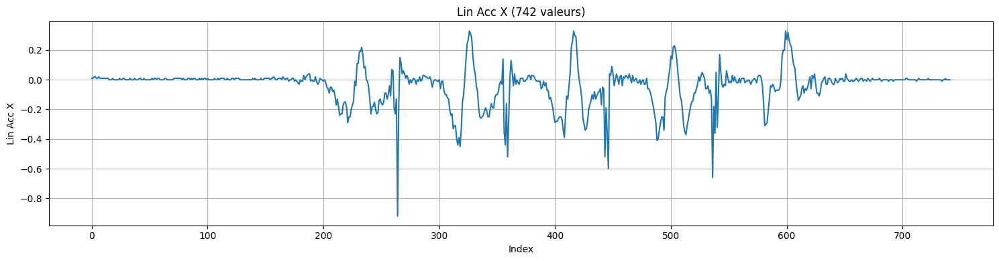

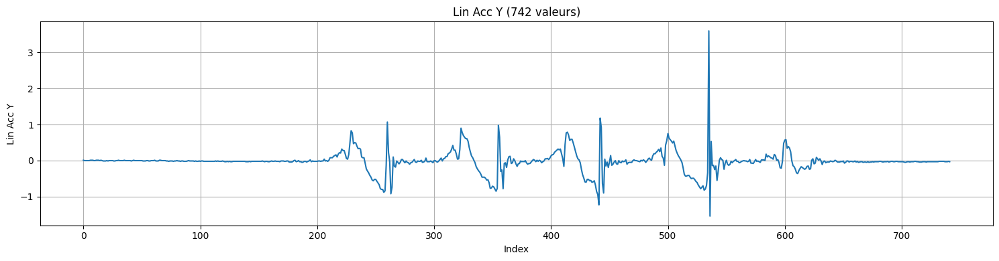

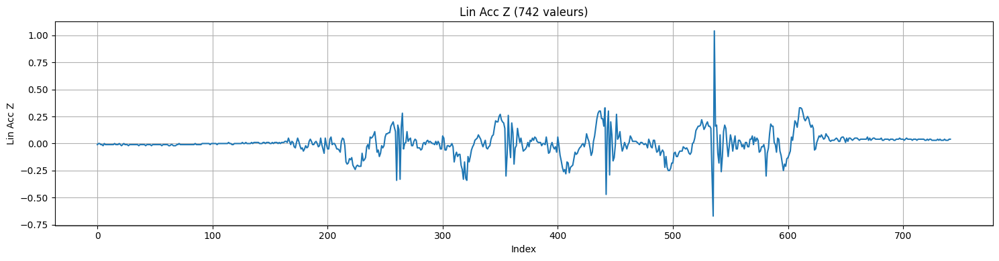

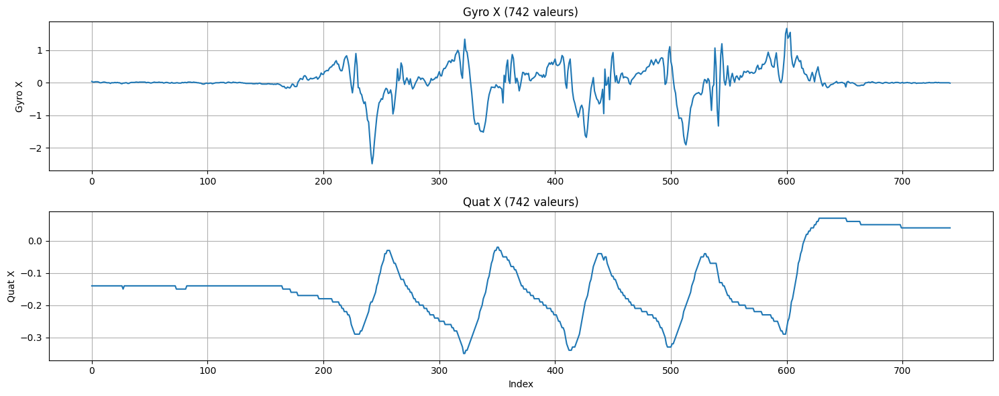

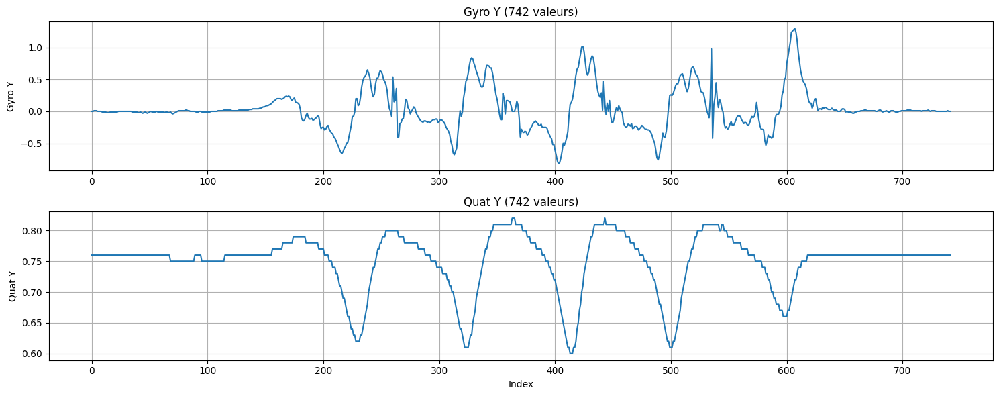

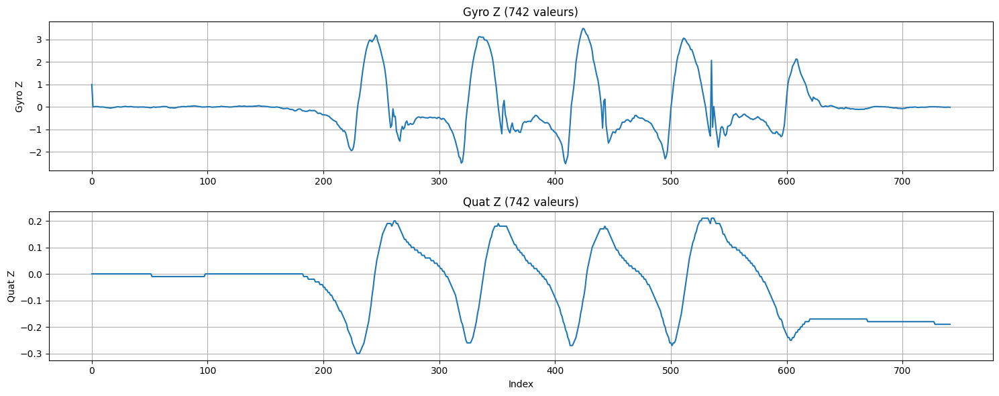

In [18]:
# chemin du fichier CSV
csv_path = "./data/data_5_steps.csv"

# lecture du fichier CSV avec pandas
df = pd.read_csv(csv_path)

# affichage des 5 premières lignes
df.head()

# récupérer les colonnes dans des "arrays" numpy
delta_t = df['delta_t'].to_numpy()
gx = df['gx'].to_numpy()
gy = df['gy'].to_numpy()
gz = df['gz'].to_numpy()
qw = df['qw'].to_numpy()
qx = df['qx'].to_numpy()
qy = df['qy'].to_numpy()
qz = df['qz'].to_numpy()
lin_ax = df['lin_ax'].to_numpy()
lin_ay = df['lin_ay'].to_numpy()
lin_az = df['lin_az'].to_numpy()

# draw data
draw_data1(lin_ax, label='Lin Acc X', kind='plot')
draw_data1(lin_ay, label='Lin Acc Y', kind='plot')
draw_data1(lin_az, label='Lin Acc Z', kind='plot')
draw_data2(gx, qx, label_x='Gyro X', label_y='Quat X')
draw_data2(gy, qy, label_x='Gyro Y', label_y='Quat Y')
draw_data2(gz, qz, label_x='Gyro Z', label_y='Quat Z')

qx1 = qx
qy1 = qy
qz1 = qz
qw1 = qw

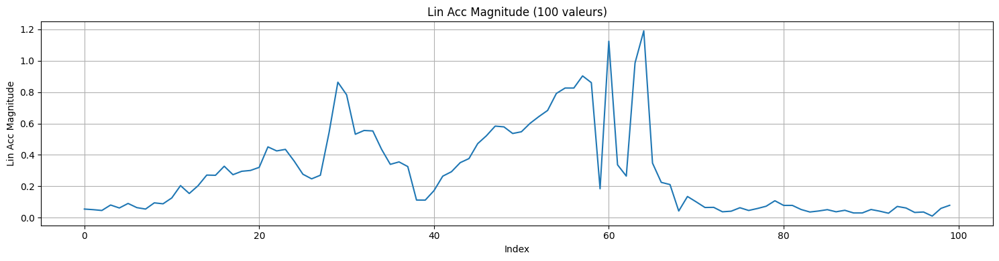

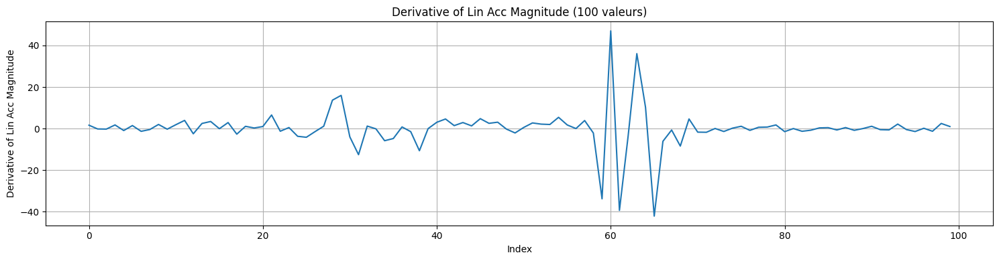

In [ ]:
start = 200
end = 300#len(lin_ax)

acc_magnitude = np.sqrt(lin_ax**2 + lin_ay**2 + lin_az**2)
derivatives = compute_derivatives(acc_magnitude, delta_t)

ema_coeff = 0.2
ema_coeff_deriv = 0.3
# Exemple d'utilisation
ema_acc_mag = compute_ema(acc_magnitude, ema_coeff)
ema_deriv = compute_ema(derivatives, ema_coeff_deriv)

draw_data1(acc_magnitude, label='Lin Acc Magnitude', kind='plot', start=start, end=end)
draw_data1(derivatives, label='Derivative of Lin Acc Magnitude', kind='plot', start=start, end=end)

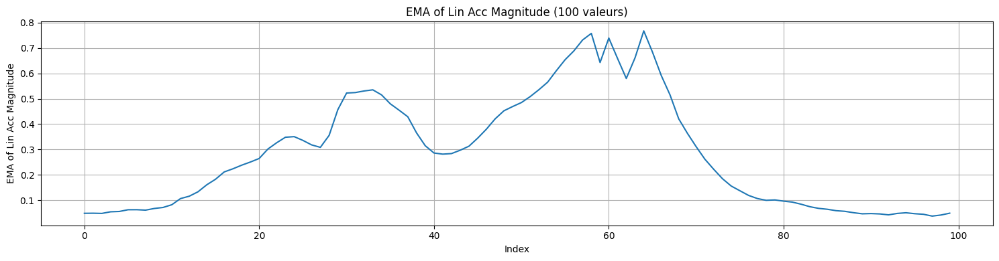

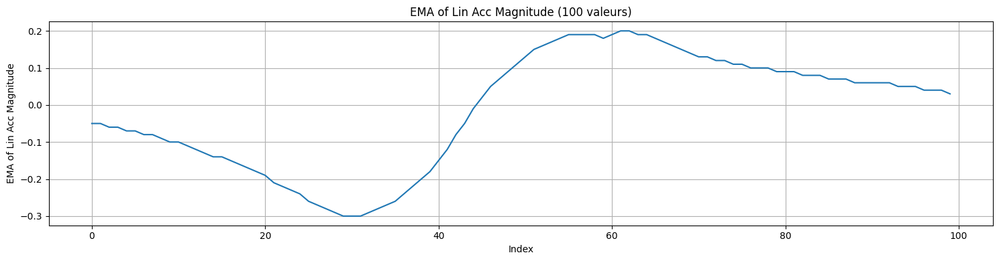

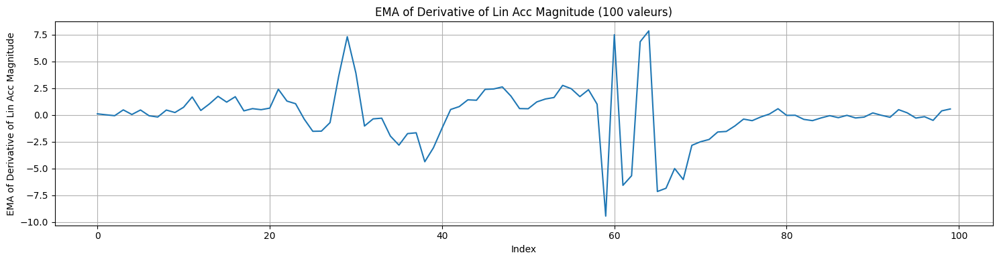

In [20]:
marge = 100

draw_data1(ema_acc_mag, label='EMA of Lin Acc Magnitude', kind='plot', start=start, end=start+marge)
draw_data1(qz, label='EMA of Lin Acc Magnitude', kind='plot', start=start, end=start+marge)
draw_data1(ema_deriv, label='EMA of Derivative of Lin Acc Magnitude', kind='plot', start=start, end=start+marge)

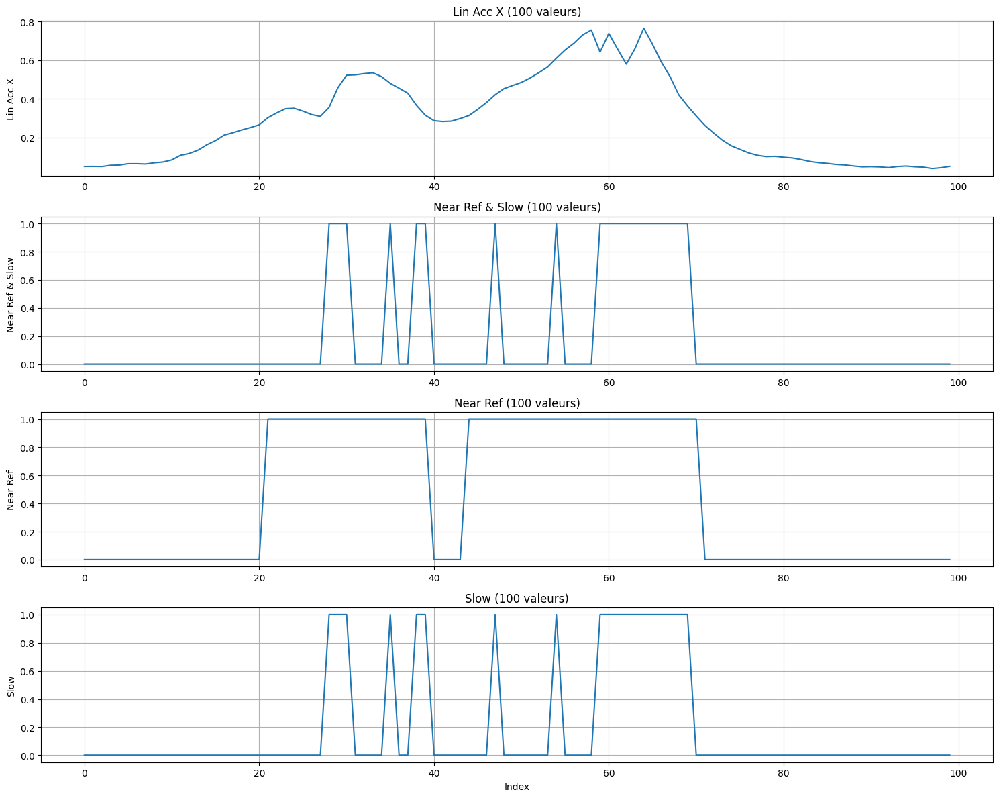

In [21]:
initial_tol = 0.3
d_initial_tol = 2.5

near_ref = np.abs(ema_acc_mag) > initial_tol
slow = np.abs(ema_deriv) > d_initial_tol


draw_data4(ema_acc_mag, near_ref & slow, near_ref, slow, label_w='Lin Acc X', label_x='Near Ref & Slow', label_y='Near Ref', label_z='Slow', kind='plot', start=start, end=end)

# travailler que sur la phase de marche 

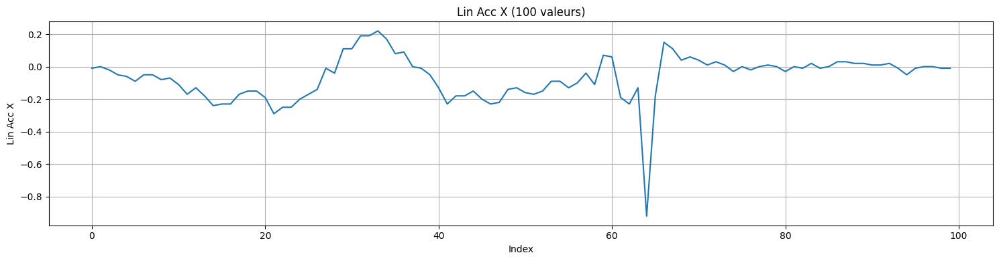

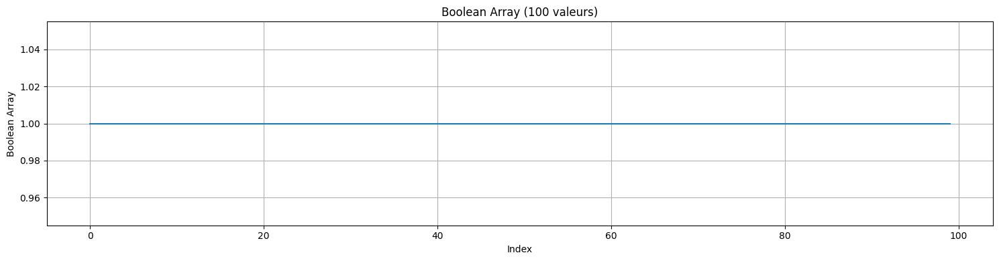

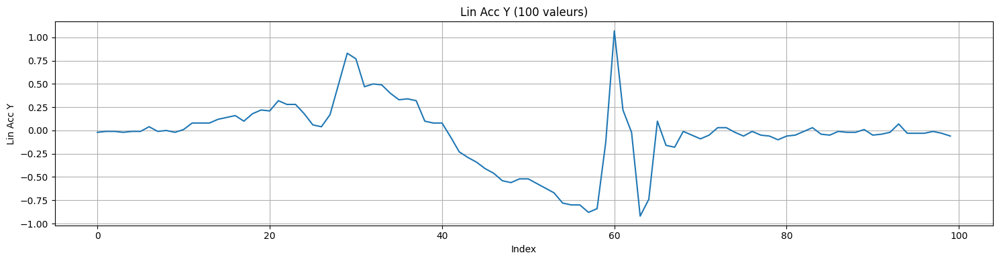

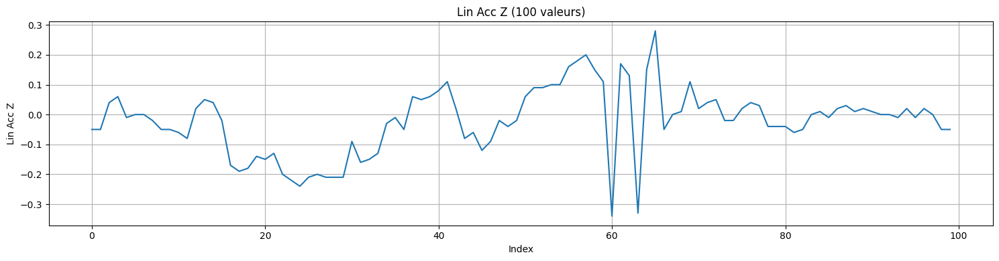

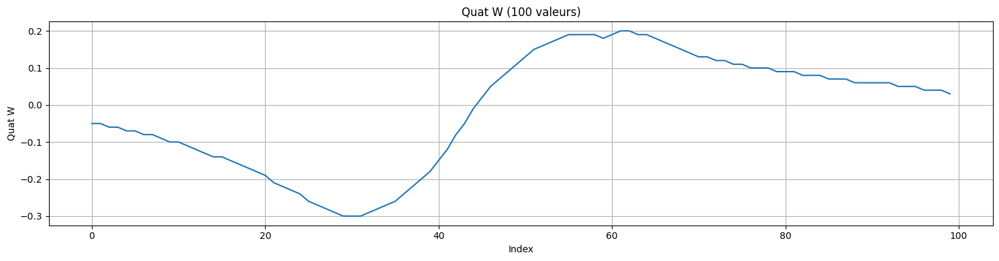

In [22]:
debut = 200#245 #230
fin = 300#305#270
N=len(lin_ax)

tab_bool = np.zeros(N, dtype=bool)
tab_bool[debut:fin] = True
draw_data1(lin_ax, label='Lin Acc X', kind='plot', start=start, end=end)
draw_data1(tab_bool, label='Boolean Array', kind='plot', start=start, end=end)
draw_data1(lin_ay, label='Lin Acc Y', kind='plot', start=start, end=end)
draw_data1(lin_az, label='Lin Acc Z', kind='plot', start=start, end=end)
draw_data1(qz, label='Quat W', kind='plot', start=start, end=end)



In [23]:
step_ax = lin_ax[debut:fin]
step_ay = lin_ay[debut:fin]
step_az = lin_az[debut:fin]
step_qw = qw[debut:fin]
step_qx = qx[debut:fin]
step_qy = qy[debut:fin]
step_qz = qz[debut:fin]
step_dt = delta_t[debut:fin]

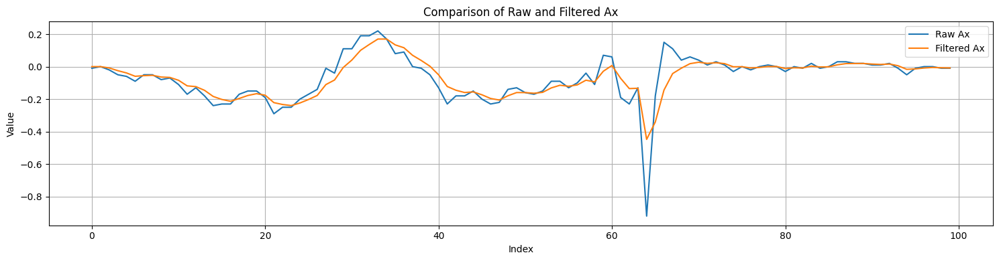

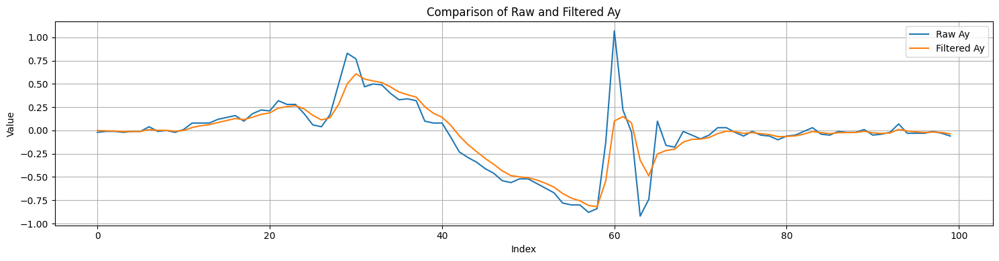

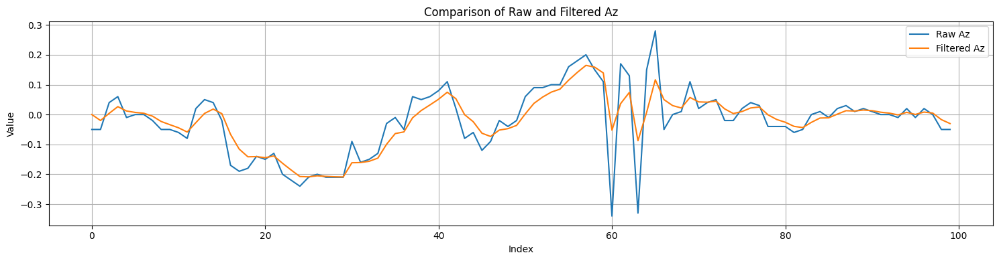

In [24]:
ax_filt, ay_filt, az_filt = low_pass_filter(step_ax, step_ay, step_az, alpha=0.4) 

draw_same_plot(step_ax, ax_filt, labels=['Raw Ax', 'Filtered Ax'], title='Comparison of Raw and Filtered Ax', kind='plot')
draw_same_plot(step_ay, ay_filt, labels=['Raw Ay', 'Filtered Ay'], title='Comparison of Raw and Filtered Ay', kind='plot')
draw_same_plot(step_az, az_filt, labels=['Raw Az', 'Filtered Az'], title='Comparison of Raw and Filtered Az', kind='plot')



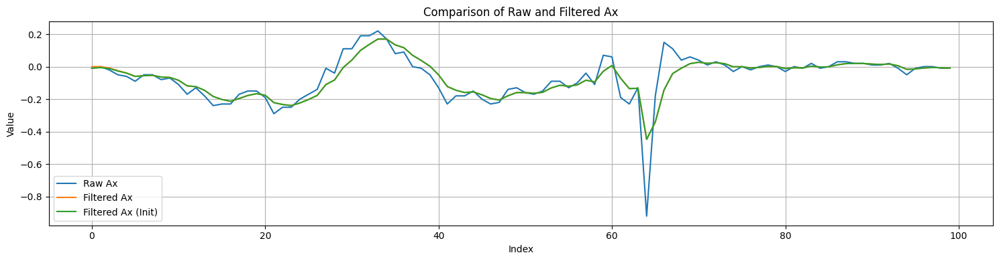

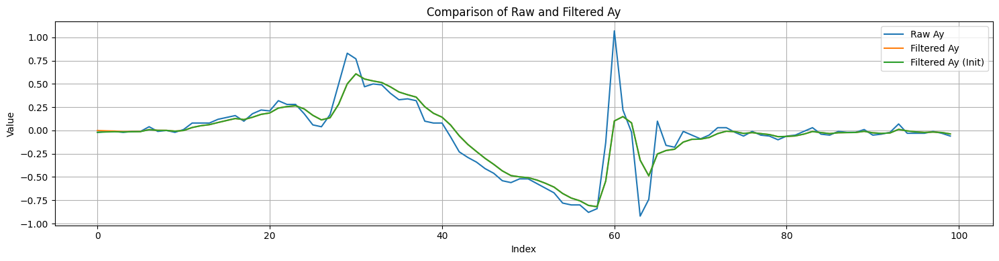

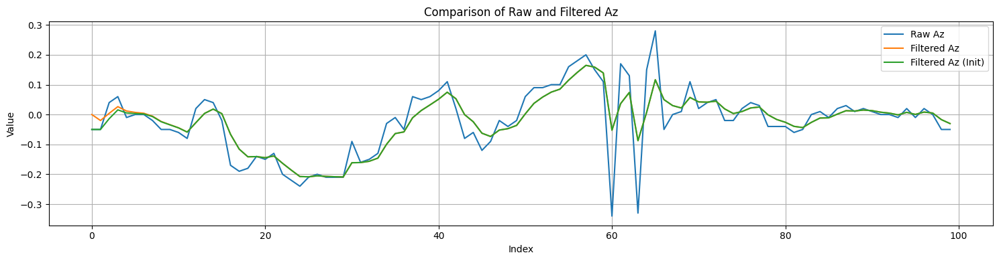

In [25]:
ax_filt_0, ay_filt_0, az_filt_0 = low_pass_filter_init(step_ax, step_ay, step_az, alpha=0.4) 

draw_same_plot(step_ax, ax_filt, ax_filt_0, labels=['Raw Ax', 'Filtered Ax', 'Filtered Ax (Init)'], title='Comparison of Raw and Filtered Ax', kind='plot')
draw_same_plot(step_ay, ay_filt, ay_filt_0, labels=['Raw Ay', 'Filtered Ay', 'Filtered Ay (Init)'], title='Comparison of Raw and Filtered Ay', kind='plot')
draw_same_plot(step_az, az_filt, az_filt_0, labels=['Raw Az', 'Filtered Az', 'Filtered Az (Init)'], title='Comparison of Raw and Filtered Az', kind='plot')


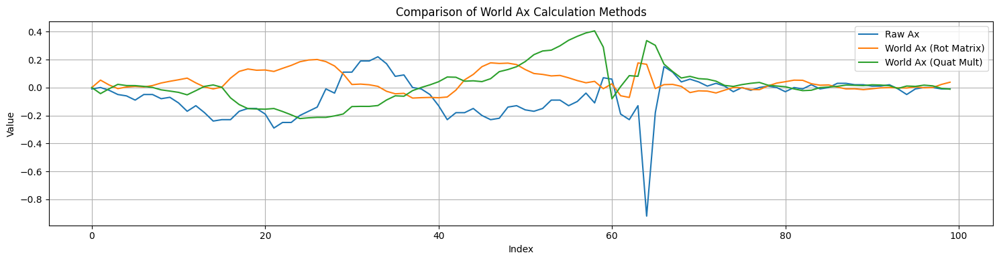

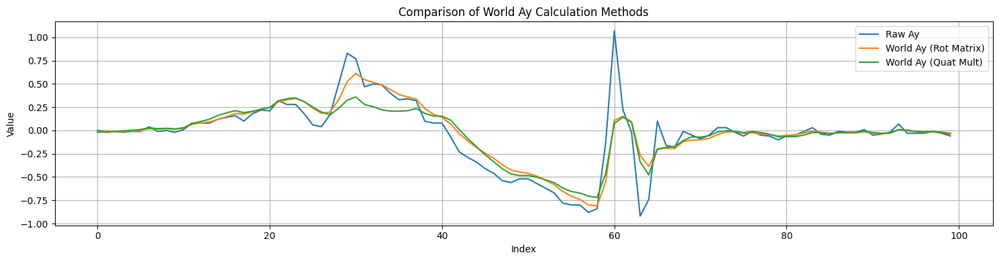

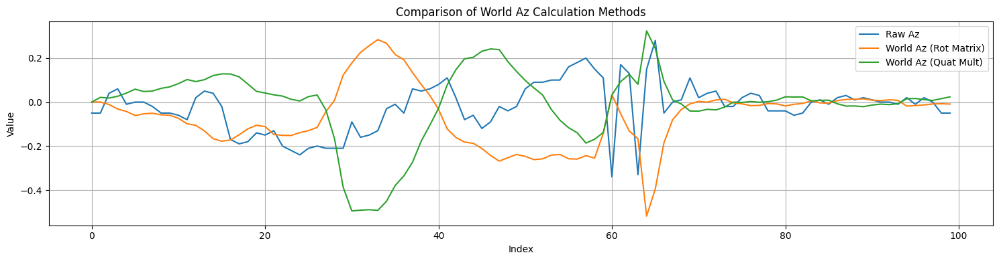

In [26]:
world_ax, world_ay, world_az = cal_acc_world_rot_matrix(ax_filt_0, ay_filt_0, az_filt_0, step_qw, step_qx, step_qy, step_qz)
world2_ax, world2_ay, world2_az = cal_acc_world_quat_multo(ax_filt_0, ay_filt_0, az_filt_0, step_qw, step_qx, step_qy, step_qz)

draw_same_plot(step_ax, world_ax, world2_ax, labels=['Raw Ax', 'World Ax (Rot Matrix)', 'World Ax (Quat Mult)'], title='Comparison of World Ax Calculation Methods', kind='plot')
draw_same_plot(step_ay, world_ay, world2_ay, labels=['Raw Ay', 'World Ay (Rot Matrix)', 'World Ay (Quat Mult)'], title='Comparison of World Ay Calculation Methods', kind='plot')
draw_same_plot(step_az, world_az, world2_az, labels=['Raw Az', 'World Az (Rot Matrix)', 'World Az (Quat Mult)'], title='Comparison of World Az Calculation Methods', kind='plot')

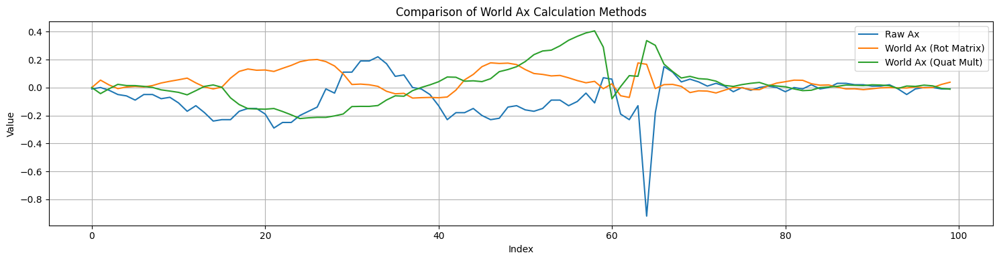

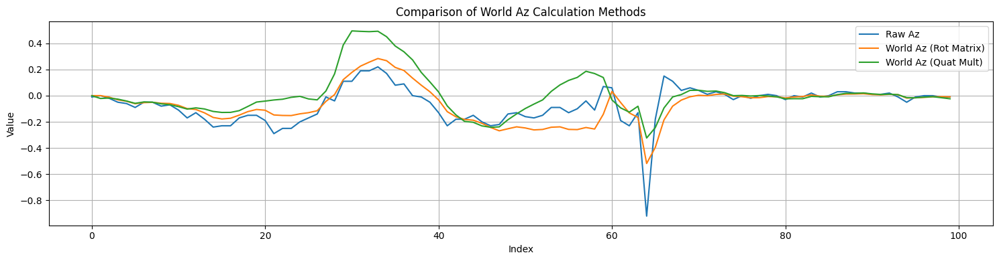

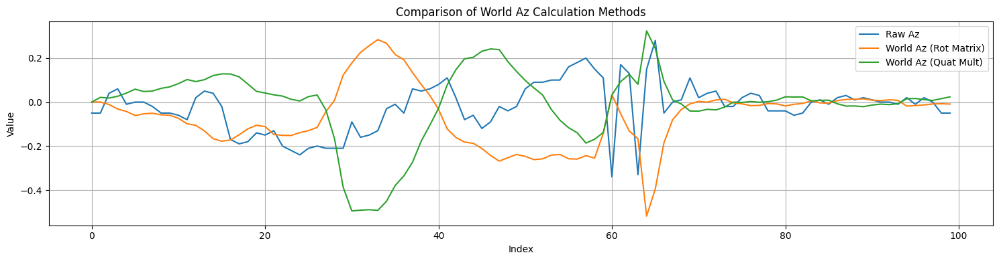

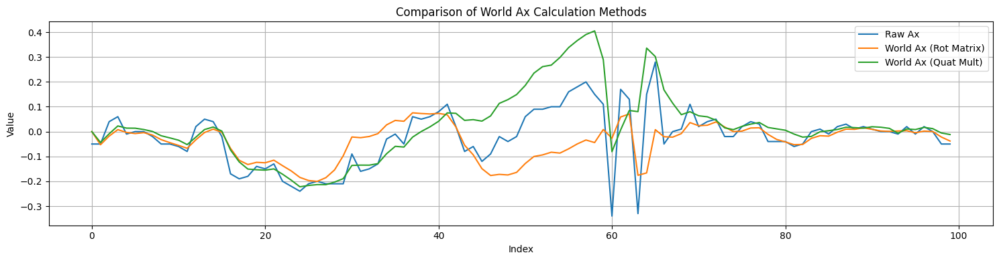

In [27]:
# il a eu un changement de ref
draw_same_plot(step_ax, world_ax, world2_ax, labels=['Raw Ax', 'World Ax (Rot Matrix)', 'World Ax (Quat Mult)'], title='Comparison of World Ax Calculation Methods', kind='plot')
draw_same_plot(step_ax, world_az, -world2_az, labels=['Raw Az', 'World Az (Rot Matrix)', 'World Az (Quat Mult)'], title='Comparison of World Az Calculation Methods', kind='plot')

draw_same_plot(step_az, world_az, world2_az, labels=['Raw Az', 'World Az (Rot Matrix)', 'World Az (Quat Mult)'], title='Comparison of World Az Calculation Methods', kind='plot')
draw_same_plot(step_az, -world_ax, world2_ax, labels=['Raw Ax', 'World Ax (Rot Matrix)', 'World Ax (Quat Mult)'], title='Comparison of World Ax Calculation Methods', kind='plot')

In [28]:
# convertir g en m/s²
world_ax, world_ay, world_az = world_ax * 9.81, world_ay * 9.81, world_az * 9.81
world2_ax, world2_ay, world2_az = world2_ax * 9.81, world2_ay * 9.81, world2_az * 9.81

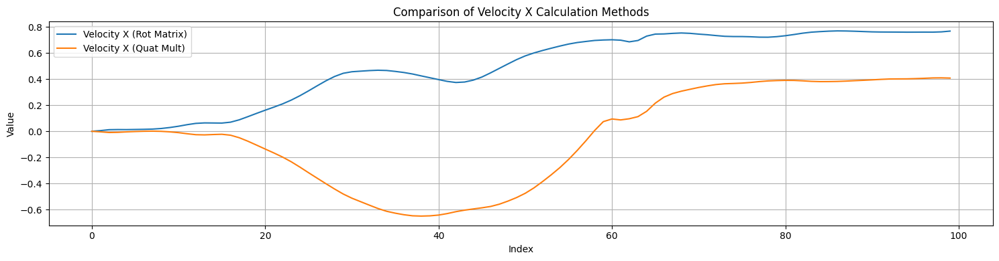

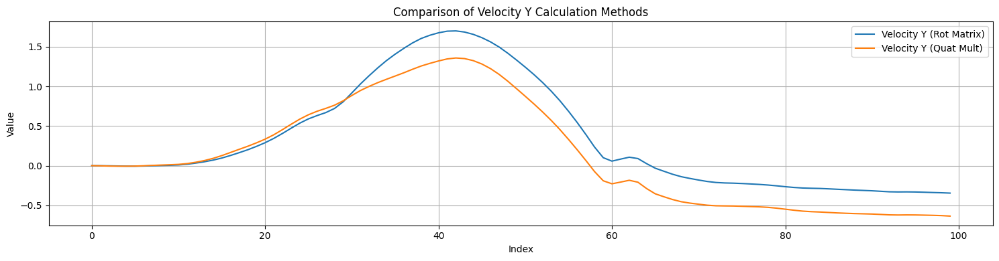

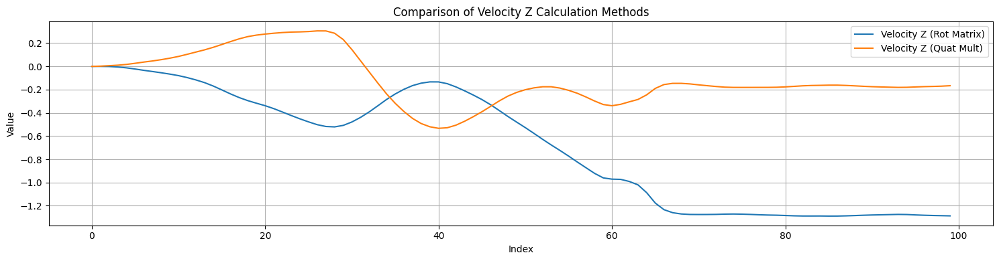

In [29]:
vx, vy, vz = trapezoidal_integration(world_ax, world_ay, world_az, step_dt).T
vx2, vy2, vz2 = trapezoidal_integration(world2_ax, world2_ay, world2_az, step_dt).T

draw_same_plot(vx, vx2, labels=['Velocity X (Rot Matrix)', 'Velocity X (Quat Mult)'], title='Comparison of Velocity X Calculation Methods', kind='plot')
draw_same_plot(vy, vy2, labels=['Velocity Y (Rot Matrix)', 'Velocity Y (Quat Mult)'], title='Comparison of Velocity Y Calculation Methods', kind='plot')
draw_same_plot(vz, vz2, labels=['Velocity Z (Rot Matrix)', 'Velocity Z (Quat Mult)'], title='Comparison of Velocity Z Calculation Methods', kind='plot')

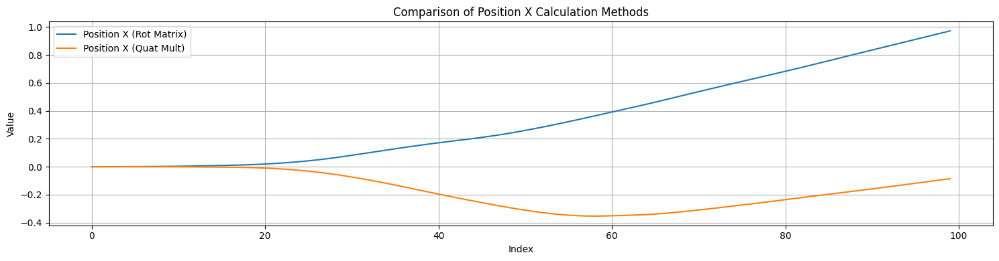

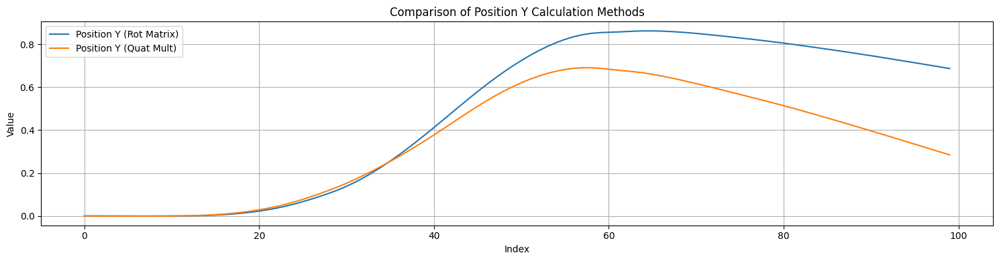

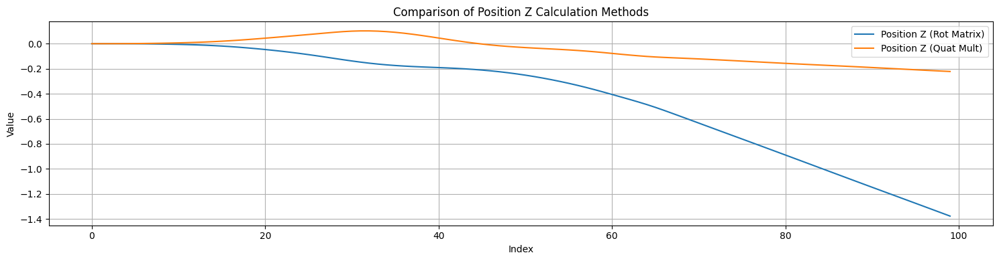

In [30]:
px, py, pz = trapezoidal_integration(vx, vy, vz, step_dt).T
px2, py2, pz2 = trapezoidal_integration(vx2, vy2, vz2, step_dt).T

draw_same_plot(px, px2, labels=['Position X (Rot Matrix)', 'Position X (Quat Mult)'], title='Comparison of Position X Calculation Methods', kind='plot')
draw_same_plot(py, py2, labels=['Position Y (Rot Matrix)', 'Position Y (Quat Mult)'], title='Comparison of Position Y Calculation Methods', kind='plot')
draw_same_plot(pz, pz2, labels=['Position Z (Rot Matrix)', 'Position Z (Quat Mult)'], title='Comparison of Position Z Calculation Methods', kind='plot')

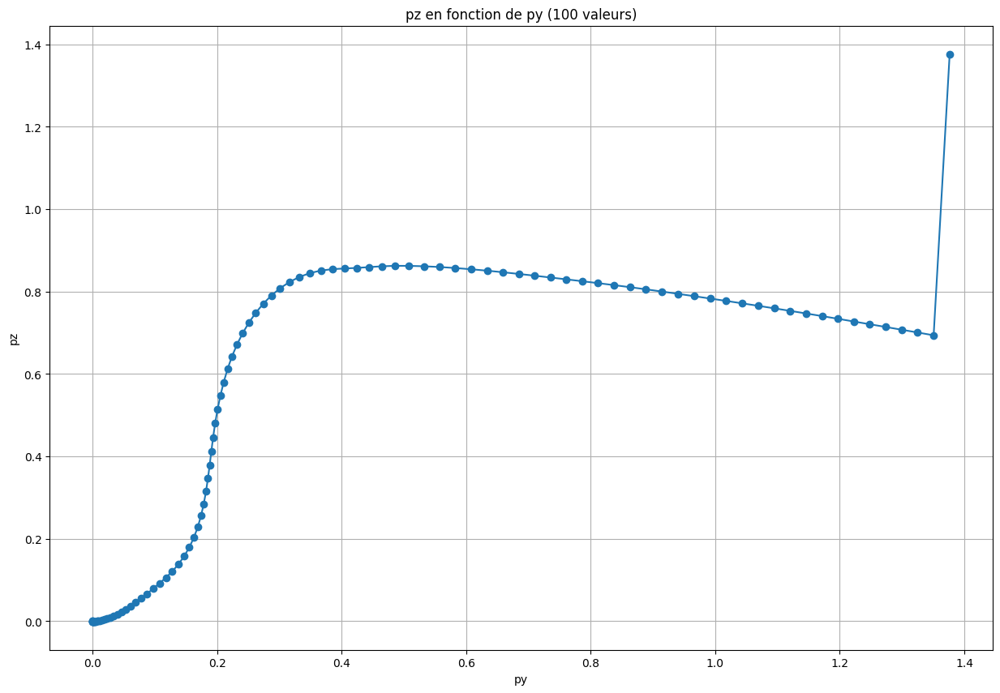

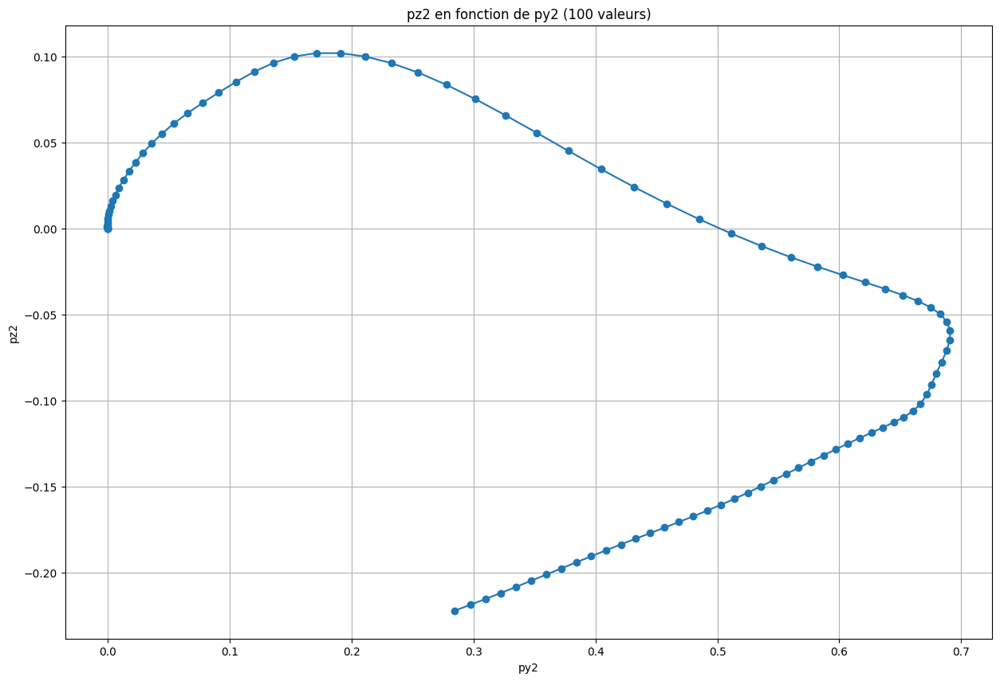

In [31]:
py[-1] = -pz[-1]
compare_data(-pz, py, xlabel='py', ylabel='pz', kind='plot')
compare_data(py2, pz2, xlabel='py2', ylabel='pz2', kind='plot')

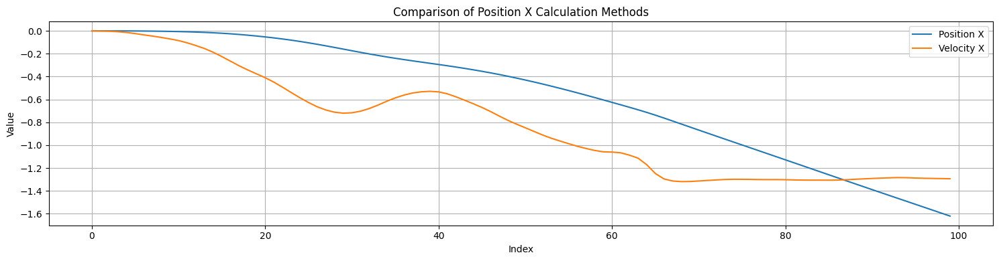

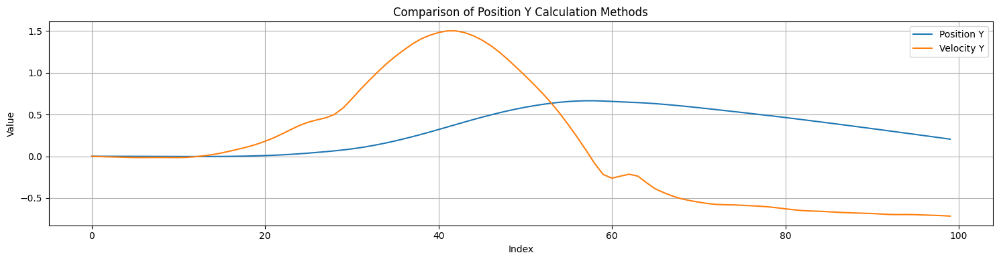

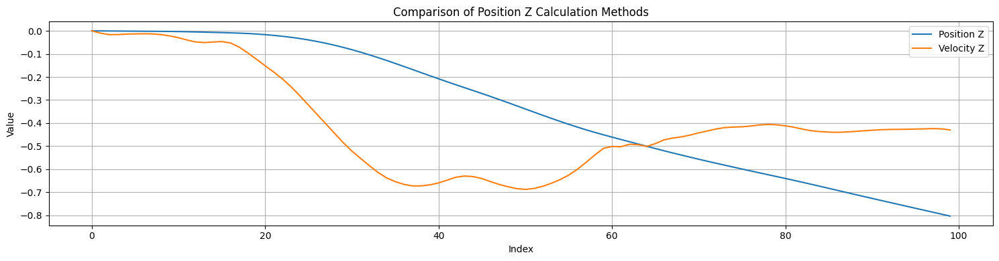

In [32]:
board_ax, board_ay, board_az = ax_filt_0*9.81, ay_filt_0*9.81, az_filt_0*9.81
board_vx, board_vy, board_vz = trapezoidal_integration(board_ax, board_ay, board_az, step_dt).T
board_px, board_py, board_pz = trapezoidal_integration(board_vx, board_vy, board_vz, step_dt).T


draw_same_plot(board_px, board_vx, labels=['Position X', 'Velocity X'], title='Comparison of Position X Calculation Methods', kind='plot')
draw_same_plot(board_py, board_vy, labels=['Position Y', 'Velocity Y'], title='Comparison of Position Y Calculation Methods', kind='plot')
draw_same_plot(board_pz, board_vz, labels=['Position Z', 'Velocity Z'], title='Comparison of Position Z Calculation Methods', kind='plot')

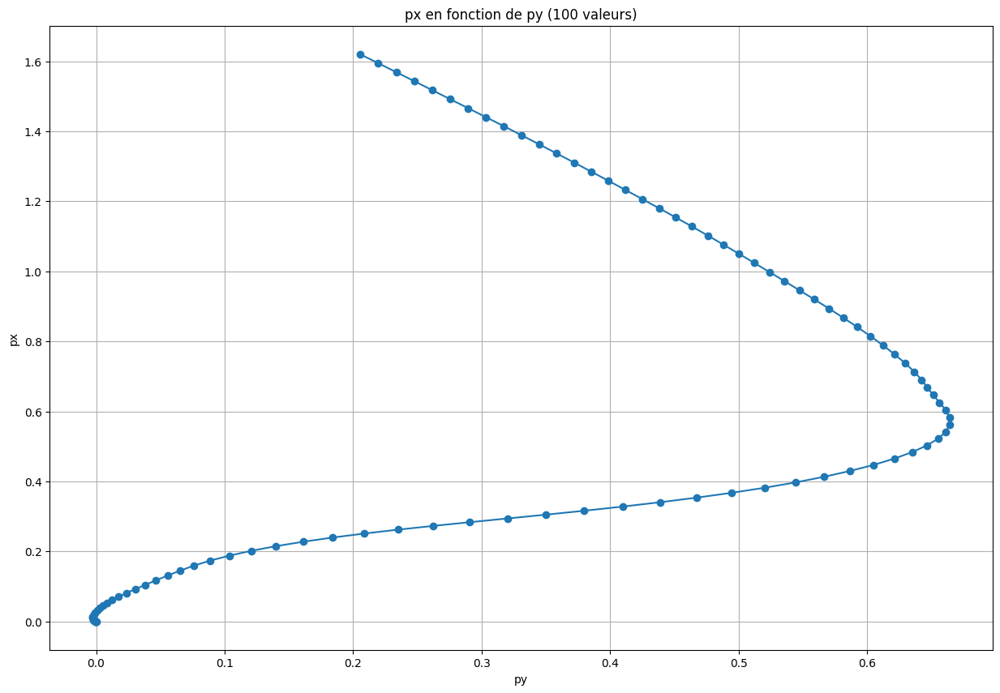

In [33]:
compare_data(board_py, -board_px, xlabel='py', ylabel='px', kind='plot')

In [34]:
def cal_pos(ax, ay, az, delta_t):
    # passé de g à m/s²
    ax, ay, az = ax * 9.81, ay * 9.81, az * 9.81
    vx, vy, vz = trapezoidal_integration(ax, ay, az, delta_t).T
    px, py, pz = trapezoidal_integration(vx, vy, vz, delta_t).T
    return px, py, pz

def cal_tout(debut, fin, mode = 1):
    step_ax = lin_ax[debut:fin]
    step_ay = lin_ay[debut:fin]
    step_az = lin_az[debut:fin]
    step_qw = qw[debut:fin]
    step_qx = qx[debut:fin]
    step_qy = qy[debut:fin]
    step_qz = qz[debut:fin]
    step_dt = delta_t[debut:fin]

    ax_filt, ay_filt, az_filt = low_pass_filter_init(step_ax, step_ay, step_az, alpha=0.4)

    if mode == 1:
        world_ax, world_ay, world_az = cal_acc_world_rot_matrix(ax_filt, ay_filt, az_filt, step_qw, step_qx, step_qy, step_qz)
    if mode == 2:
        world_ax, world_ay, world_az = cal_acc_world_quat_multo(ax_filt, ay_filt, az_filt, step_qw, step_qx, step_qy, step_qz)
    if mode == 3:
        world_ax, world_ay, world_az = ax_filt, ay_filt, az_filt

    px, py, pz = cal_pos(world_ax, world_ay, world_az, step_dt)

    return px, py, pz

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def draw_3d(x, y, z, title='3D Trajectory'):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot(x, y, z, marker='o')
    ax.set_xlabel('X Position (m)')
    ax.set_ylabel('Y Position (m)')
    ax.set_zlabel('Z Position (m)')
    ax.set_title(title)
    plt.show()


In [35]:
def cal_mode(mode):
    px1, py1, pz1 = cal_tout(200, 245, mode=mode)
    px2, py2, pz2 = cal_tout(245, 305, mode=mode)

    px2 += px1[-1]
    py2 += py1[-1]
    pz2 += pz1[-1]

    px = np.concatenate([px1, px2])
    py = np.concatenate([py1, py2])
    pz = np.concatenate([pz1, pz2])

    draw_3d(px, py, pz)

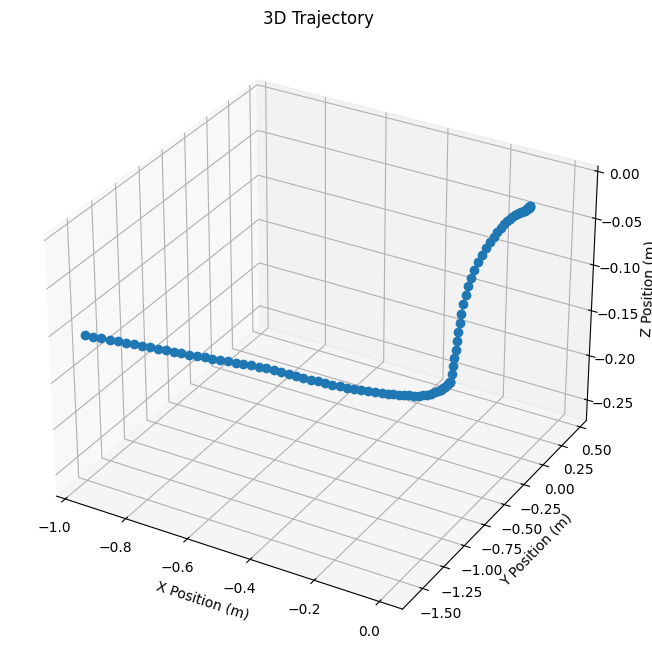

In [36]:
cal_mode(mode=3)

# 2nd datas

In [37]:
# chemin du fichier CSV
csv_path = "./data/data_slow_step_left_first.csv"

# lecture du fichier CSV avec pandas
df = pd.read_csv(csv_path)

# affichage des 5 premières lignes
df.head()

# récupérer les colonnes dans des "arrays" numpy
delta_t = df['delta_t'].to_numpy()
gx = df['gx'].to_numpy()
gy = df['gy'].to_numpy()
gz = df['gz'].to_numpy()
qw = df['qw'].to_numpy()
qx = df['qx'].to_numpy()
qy = df['qy'].to_numpy()
qz = df['qz'].to_numpy()
lin_ax = df['lin_ax'].to_numpy()
lin_ay = df['lin_ay'].to_numpy()
lin_az = df['lin_az'].to_numpy()

qx3 = qx
qy3 = qy
qz3 = qz
qw3 = qw

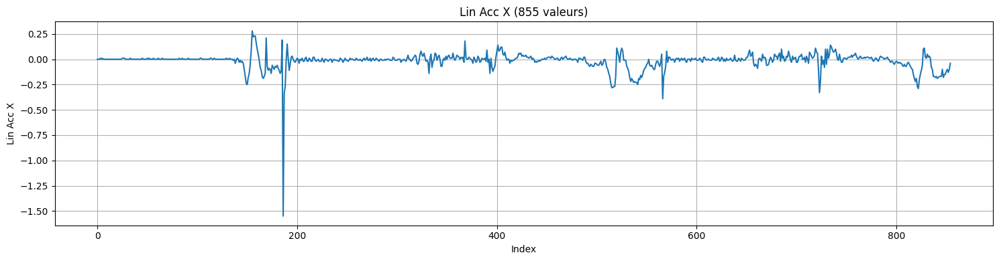

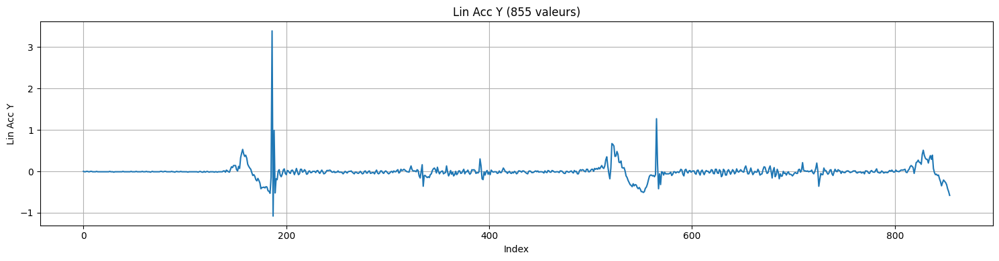

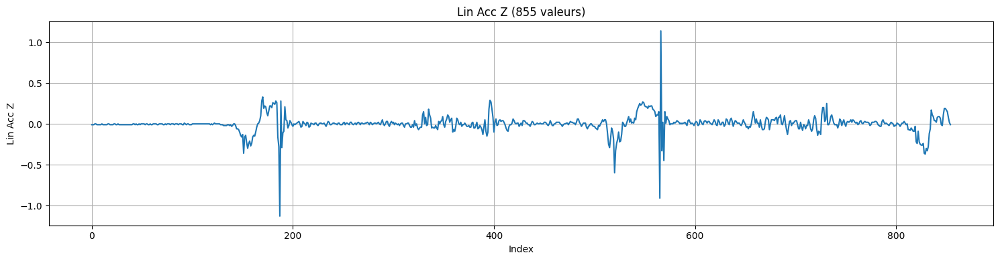

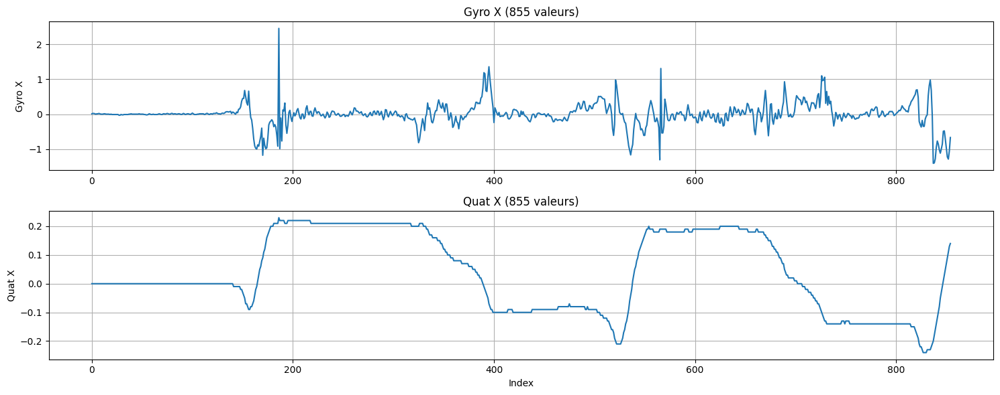

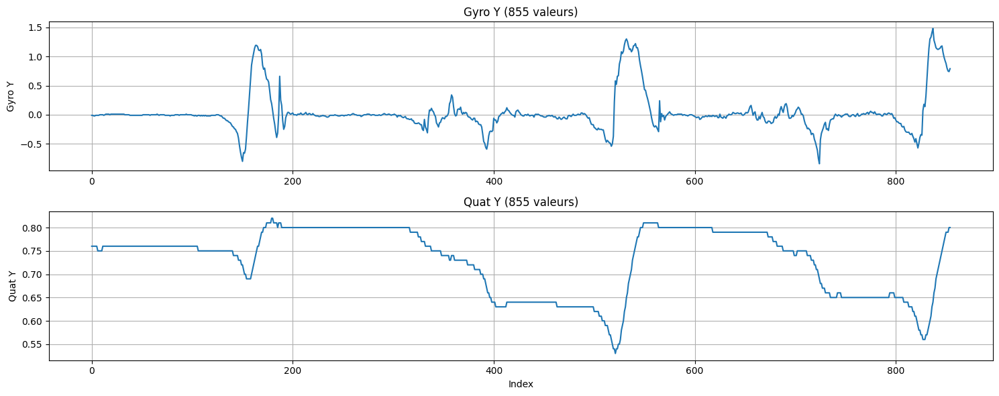

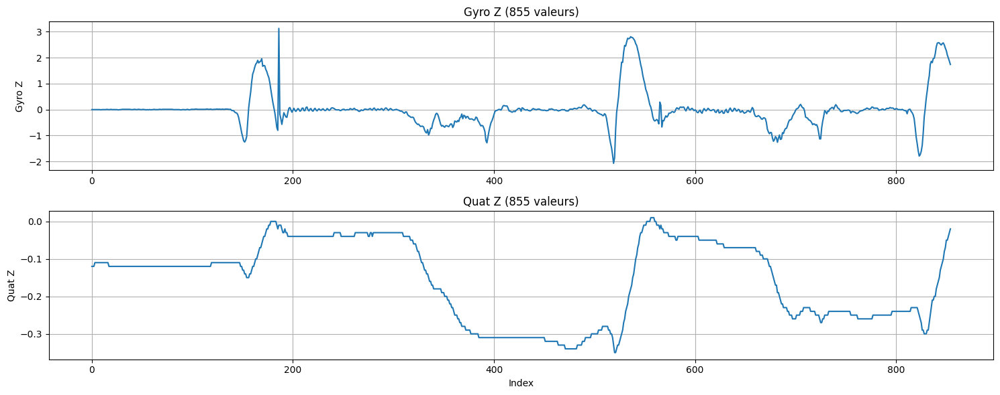

In [38]:
# chemin du fichier CSV
csv_path = "./data/data_slow_step_right_first.csv"

# lecture du fichier CSV avec pandas
df = pd.read_csv(csv_path)

# affichage des 5 premières lignes
df.head()

# récupérer les colonnes dans des "arrays" numpy
delta_t = df['delta_t'].to_numpy()
gx = df['gx'].to_numpy()
gy = df['gy'].to_numpy()
gz = df['gz'].to_numpy()
qw = df['qw'].to_numpy()
qx = df['qx'].to_numpy()
qy = df['qy'].to_numpy()
qz = df['qz'].to_numpy()
lin_ax = df['lin_ax'].to_numpy()
lin_ay = df['lin_ay'].to_numpy()
lin_az = df['lin_az'].to_numpy()

# draw data
draw_data1(lin_ax, label='Lin Acc X', kind='plot')
draw_data1(lin_ay, label='Lin Acc Y', kind='plot')
draw_data1(lin_az, label='Lin Acc Z', kind='plot')
draw_data2(gx, qz, label_x='Gyro X', label_y='Quat X')
draw_data2(gy, qy, label_x='Gyro Y', label_y='Quat Y')
draw_data2(gz, qx, label_x='Gyro Z', label_y='Quat Z')

qx2 = qx
qy2 = qy
qz2 = qz
qw2 = qw

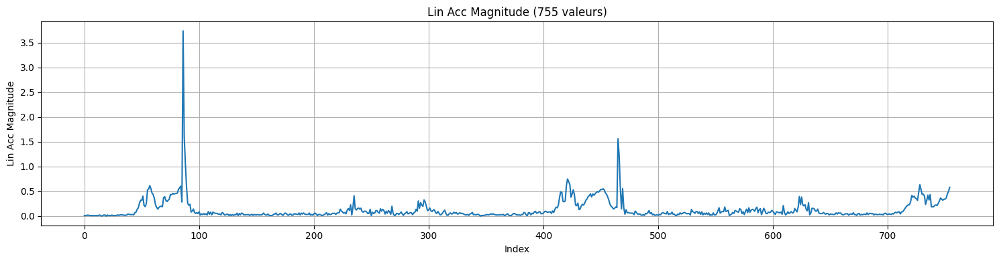

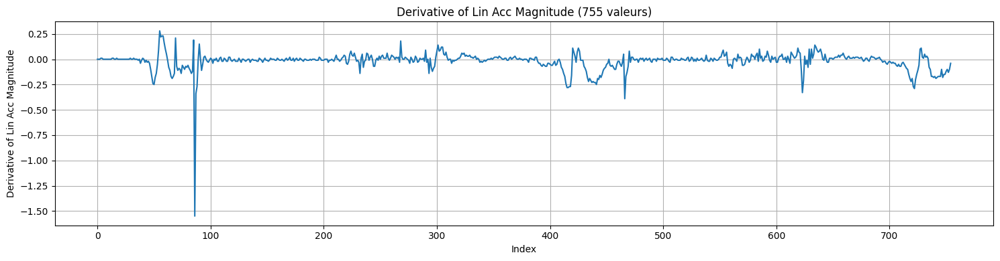

In [ ]:
start = 100
end = len(lin_ax)

acc_magnitude = np.sqrt(lin_ax**2 + lin_ay**2 + lin_az**2)
derivatives = compute_derivatives(acc_magnitude, delta_t)

ema_coeff = 0.2
ema_coeff_deriv = 0.3
# Exemple d'utilisation
ema_acc_mag = compute_ema(acc_magnitude, ema_coeff)
ema_deriv = compute_ema(derivatives, ema_coeff_deriv)

draw_data1(acc_magnitude, label='Lin Acc Magnitude', kind='plot', start=start, end=end)
draw_data1(lin_ax, label='Derivative of Lin Acc Magnitude', kind='plot', start=start, end=end)

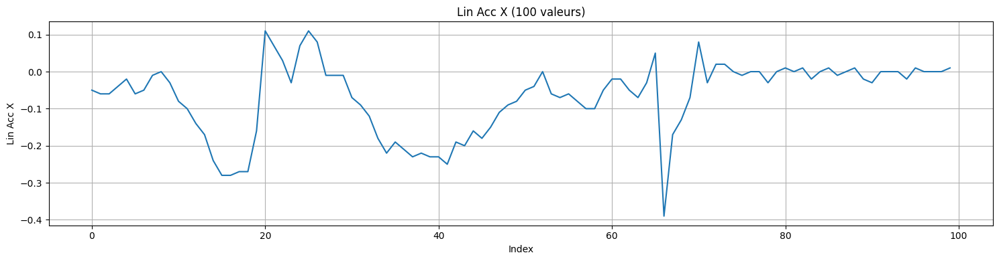

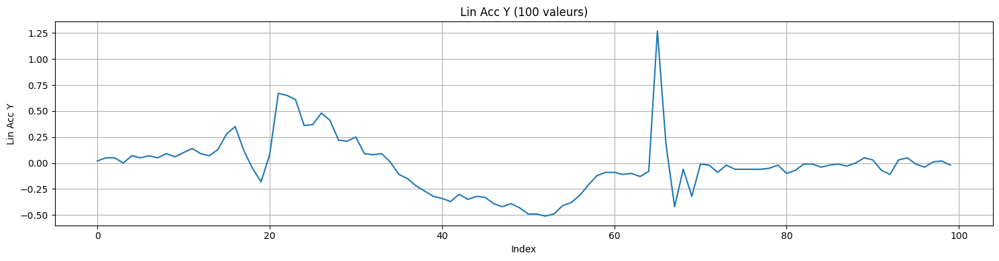

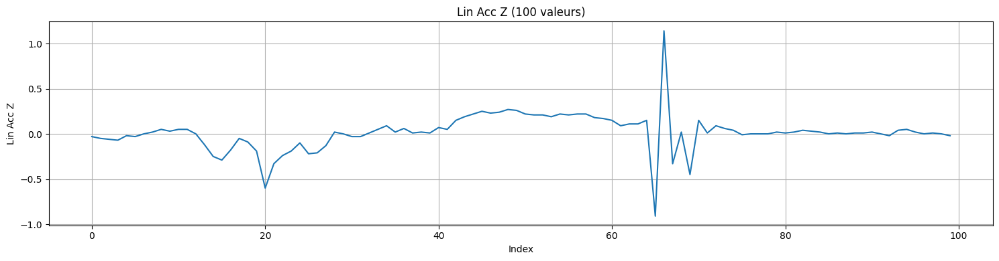

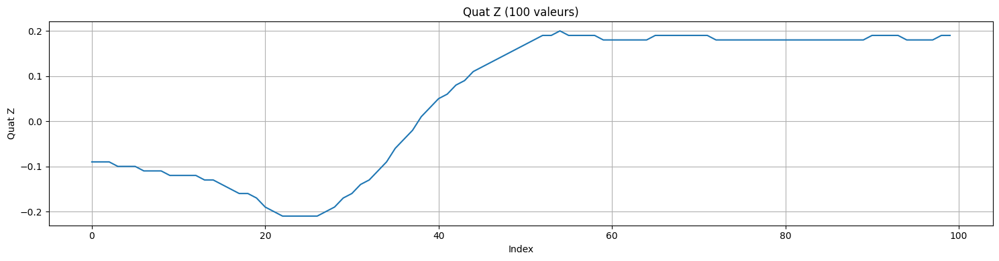

In [40]:
debut = 500
fin = 600
N=len(lin_ax)

draw_data1(lin_ax, label='Lin Acc X', kind='plot', start=debut, end=fin)
draw_data1(lin_ay, label='Lin Acc Y', kind='plot', start=debut, end=fin)
draw_data1(lin_az, label='Lin Acc Z', kind='plot', start=debut, end=fin)
draw_data1(qz, label='Quat Z', kind='plot', start=debut, end=fin)

In [41]:
step_ax = lin_ax[debut:fin]
step_ay = lin_ay[debut:fin]
step_az = np.zeros(fin - debut)  # on met az à zéro pour ce test
step_qw = qw[debut:fin]
step_qx = qx[debut:fin]
step_qy = qy[debut:fin]
step_qz = qz[debut:fin]
step_dt = delta_t[debut:fin]

# inverser l'axe x 
step_ax = -step_ax

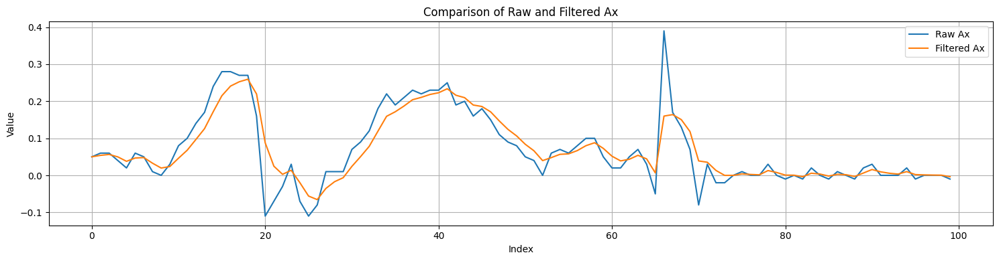

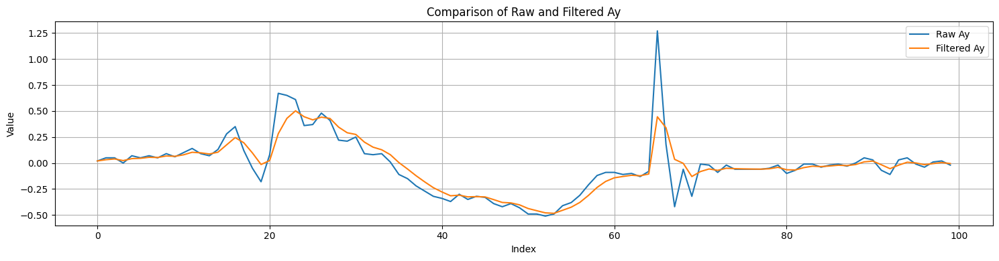

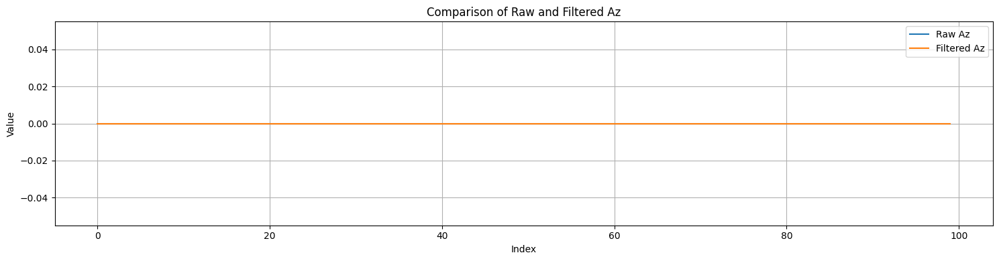

In [42]:
ax_filt, ay_filt, az_filt = low_pass_filter_init(step_ax, step_ay, step_az, alpha=0.4) 

draw_same_plot(step_ax, ax_filt, labels=['Raw Ax', 'Filtered Ax'], title='Comparison of Raw and Filtered Ax', kind='plot')
draw_same_plot(step_ay, ay_filt, labels=['Raw Ay', 'Filtered Ay'], title='Comparison of Raw and Filtered Ay', kind='plot')
draw_same_plot(step_az, az_filt, labels=['Raw Az', 'Filtered Az'], title='Comparison of Raw and Filtered Az', kind='plot')

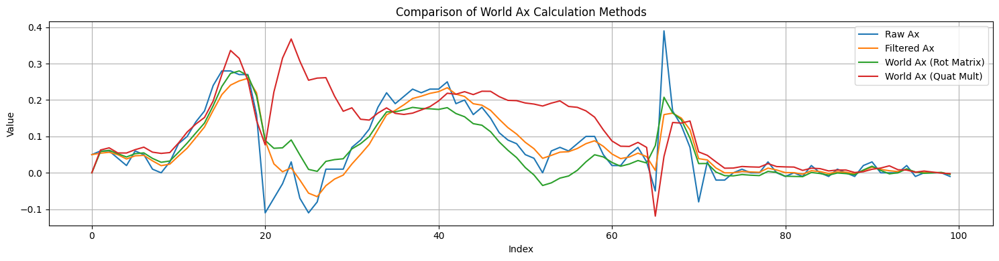

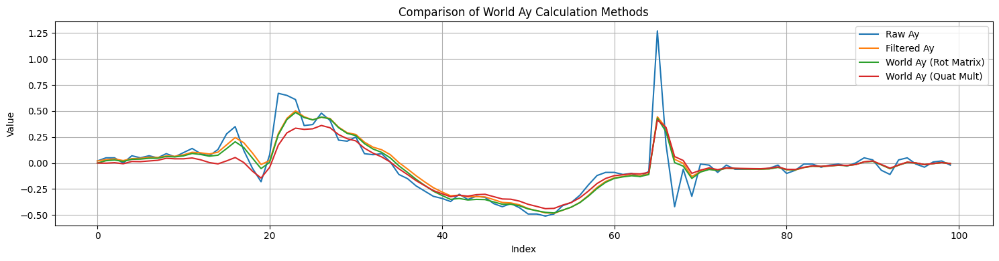

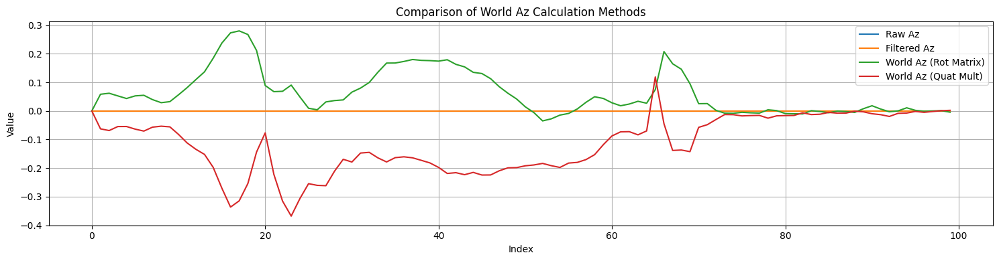

In [43]:
world_ax, world_ay, world_az = cal_acc_world_rot_matrix(ax_filt, ay_filt, az_filt, step_qw, step_qx, step_qy, step_qz)
world2_ax, world2_ay, world2_az = cal_acc_world_quat_multo(ax_filt, ay_filt, az_filt, step_qw, step_qx, step_qy, step_qz)

world_ax = world_az
world2_ax = -world2_az


draw_same_plot(step_ax, ax_filt, world_ax, world2_ax, labels=['Raw Ax', 'Filtered Ax', 'World Ax (Rot Matrix)', 'World Ax (Quat Mult)'], title='Comparison of World Ax Calculation Methods', kind='plot')
draw_same_plot(step_ay, ay_filt, world_ay, world2_ay, labels=['Raw Ay', 'Filtered Ay', 'World Ay (Rot Matrix)', 'World Ay (Quat Mult)'], title='Comparison of World Ay Calculation Methods', kind='plot')
draw_same_plot(step_az, az_filt, world_az, world2_az, labels=['Raw Az', 'Filtered Az', 'World Az (Rot Matrix)', 'World Az (Quat Mult)'], title='Comparison of World Az Calculation Methods', kind='plot')

In [44]:
# convertir g en m/s²
world_ax, world_ay, world_az = world_ax * 9.81, world_ay * 9.81, world_az * 9.81
world2_ax, world2_ay, world2_az = world2_ax * 9.81, world2_ay * 9.81, world2_az * 9.81

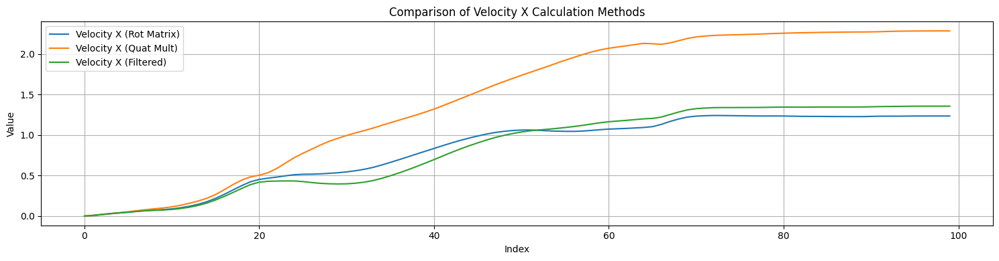

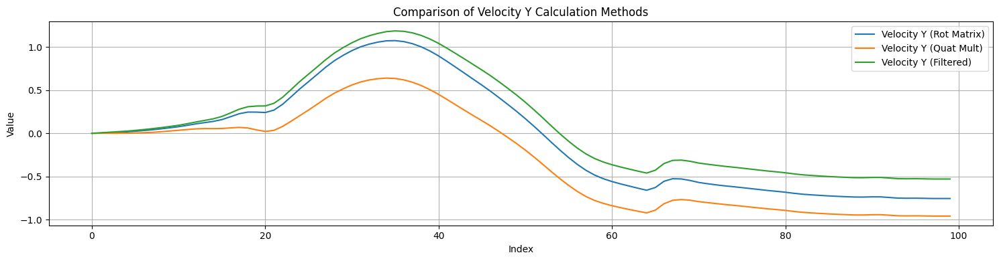

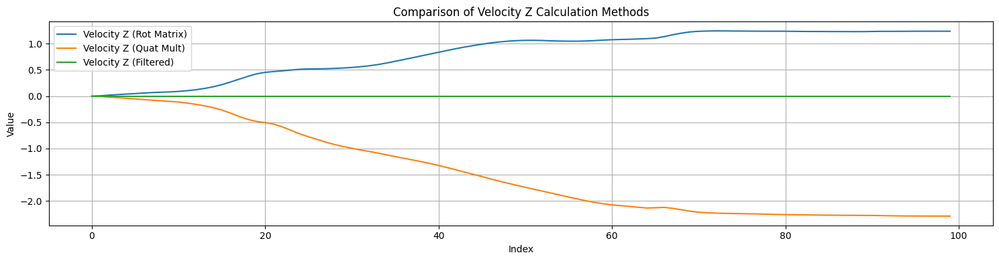

In [45]:
vx, vy, vz = trapezoidal_integration(world_ax, world_ay, world_az, step_dt).T
vx2, vy2, vz2 = trapezoidal_integration(world2_ax, world2_ay, world2_az, step_dt).T
vx3, vy3, vz3 = trapezoidal_integration(ax_filt*9.81, ay_filt*9.81, az_filt*9.81, step_dt).T

draw_same_plot(vx, vx2, vx3, labels=['Velocity X (Rot Matrix)', 'Velocity X (Quat Mult)', 'Velocity X (Filtered)'], title='Comparison of Velocity X Calculation Methods', kind='plot')
draw_same_plot(vy, vy2, vy3, labels=['Velocity Y (Rot Matrix)', 'Velocity Y (Quat Mult)', 'Velocity Y (Filtered)'], title='Comparison of Velocity Y Calculation Methods', kind='plot')
draw_same_plot(vz, vz2, vz3, labels=['Velocity Z (Rot Matrix)', 'Velocity Z (Quat Mult)', 'Velocity Z (Filtered)'], title='Comparison of Velocity Z Calculation Methods', kind='plot')

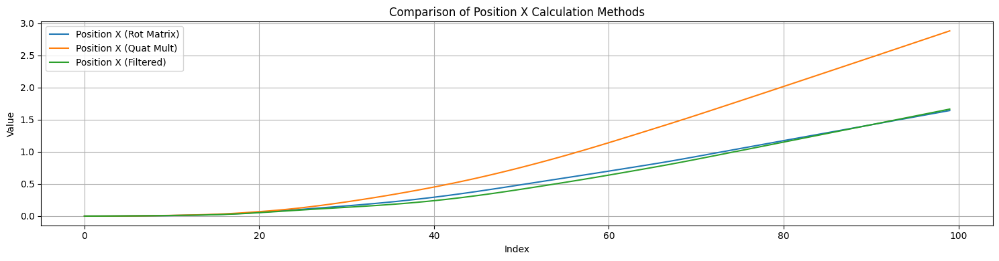

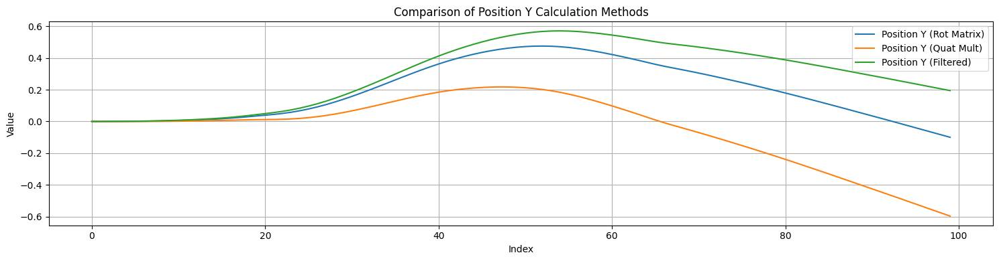

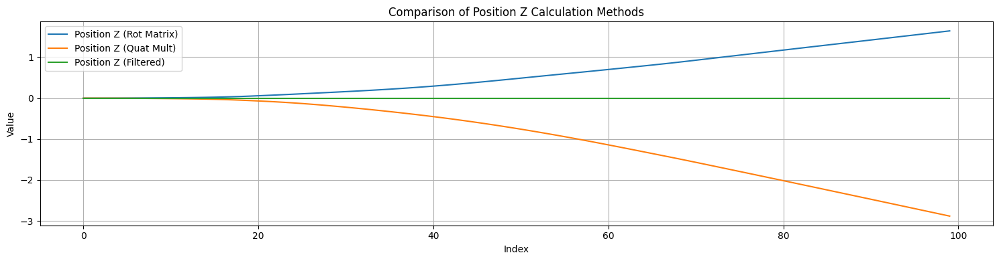

In [46]:
px, py, pz = trapezoidal_integration(vx, vy, vz, step_dt).T
px2, py2, pz2 = trapezoidal_integration(vx2, vy2, vz2, step_dt).T
px3, py3, pz3 = trapezoidal_integration(vx3, vy3, vz3, step_dt).T

draw_same_plot(px, px2, px3, labels=['Position X (Rot Matrix)', 'Position X (Quat Mult)', 'Position X (Filtered)'], title='Comparison of Position X Calculation Methods', kind='plot')
draw_same_plot(py, py2, py3, labels=['Position Y (Rot Matrix)', 'Position Y (Quat Mult)', 'Position Y (Filtered)'], title='Comparison of Position Y Calculation Methods', kind='plot')
draw_same_plot(pz, pz2, pz3, labels=['Position Z (Rot Matrix)', 'Position Z (Quat Mult)', 'Position Z (Filtered)'], title='Comparison of Position Z Calculation Methods', kind='plot')

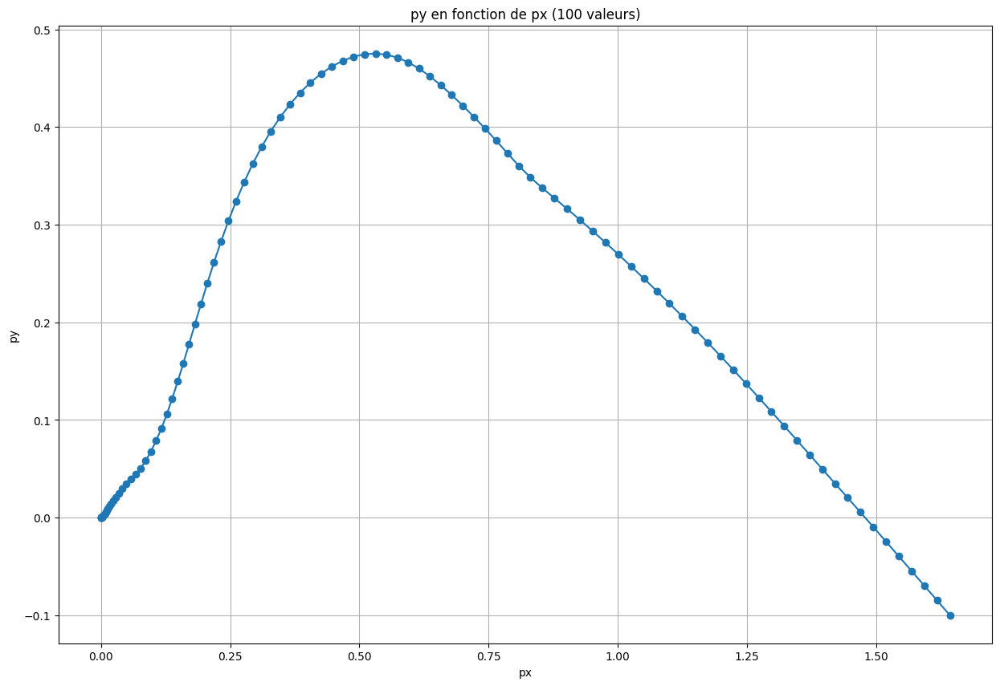

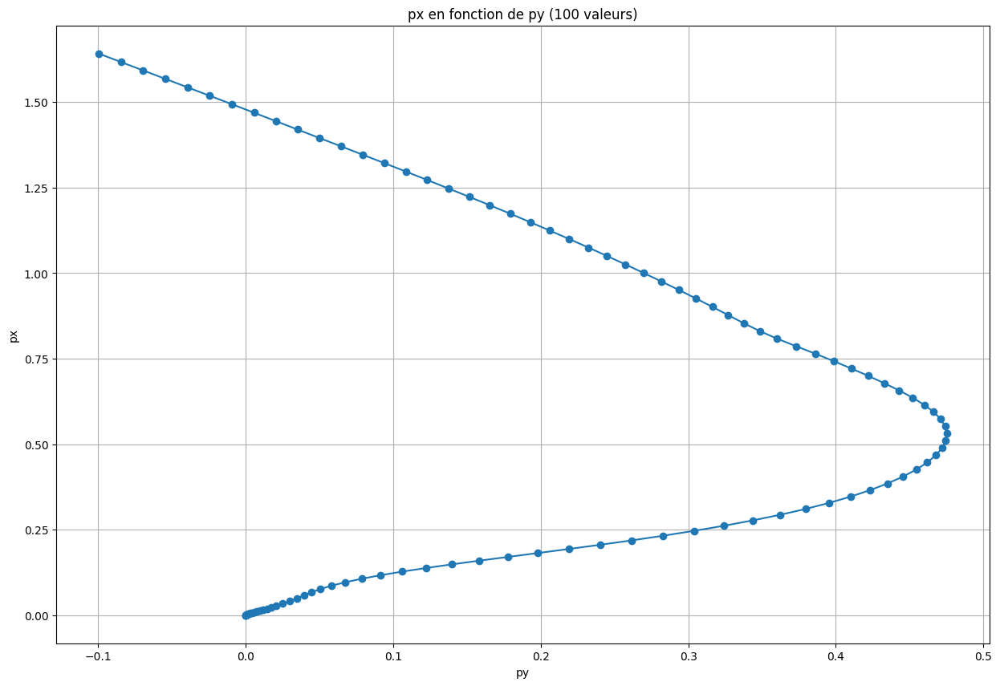

In [47]:
compare_data(px, py, xlabel='px', ylabel='py', kind='plot')
compare_data(py, px, xlabel='py', ylabel='px', kind='plot')


In [48]:
def cal_mode(mode):
    px1, py1, pz1 = cal_tout(500, 535, mode=mode)
    px2, py2, pz2 = cal_tout(535, 560, mode=mode)
    # px3, py3, pz3 = cal_tout(560, 600, mode=mode)

    px2 += px1[-1]
    py2 += py1[-1]
    pz2 += pz1[-1]

    # px3 += px2[-1]
    # py3 += py2[-1]
    # pz3 += pz2[-1]

    px = np.concatenate([px1, px2])
    py = np.concatenate([py1, py2])
    pz = np.concatenate([pz1, pz2])

    draw_same_plot(px, py, pz, labels=['Position X', 'Position Y', 'Position Z'], title='3D Trajectory', kind='plot')
    compare_data(px, py, xlabel='px', ylabel='py', kind='plot')

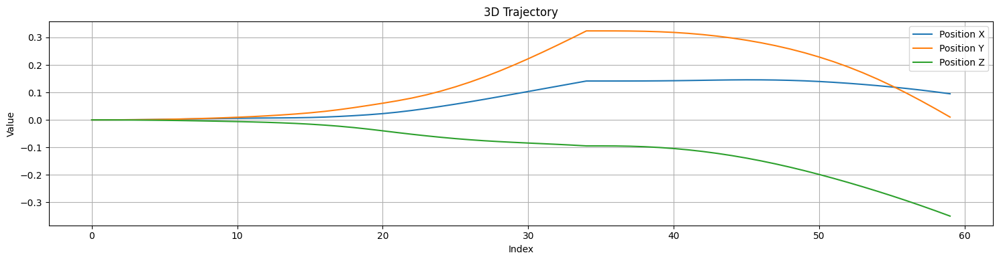

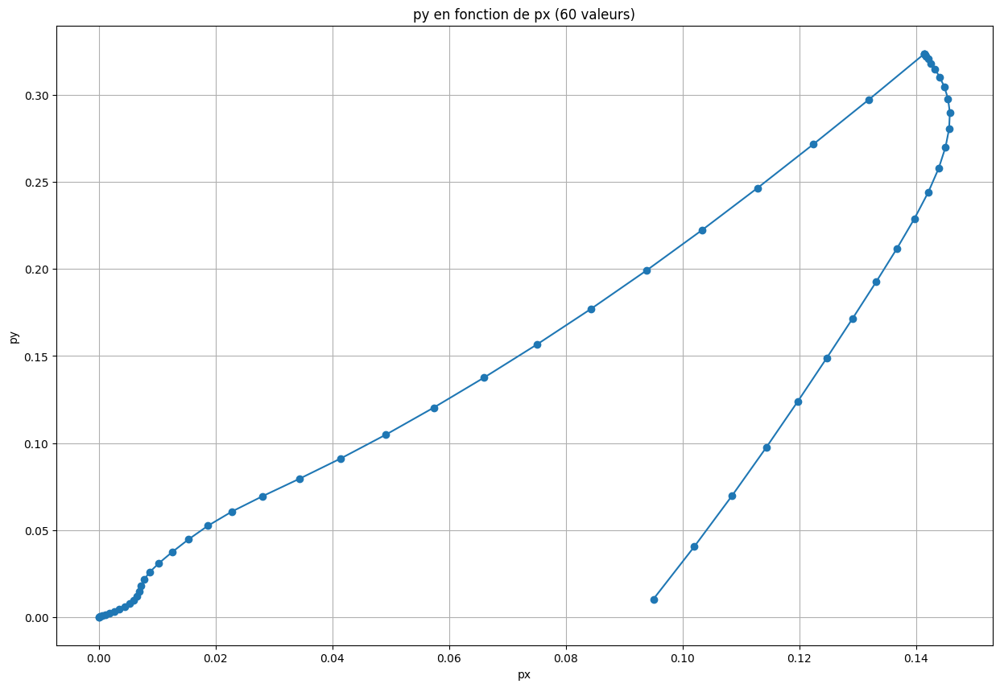

In [49]:
cal_mode(mode=1)

# identification des etats

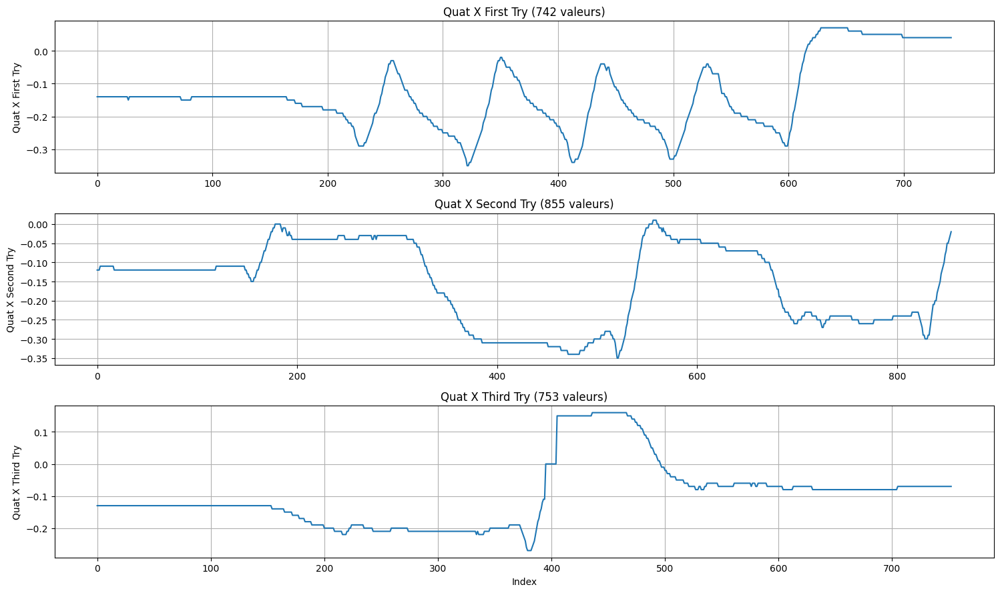

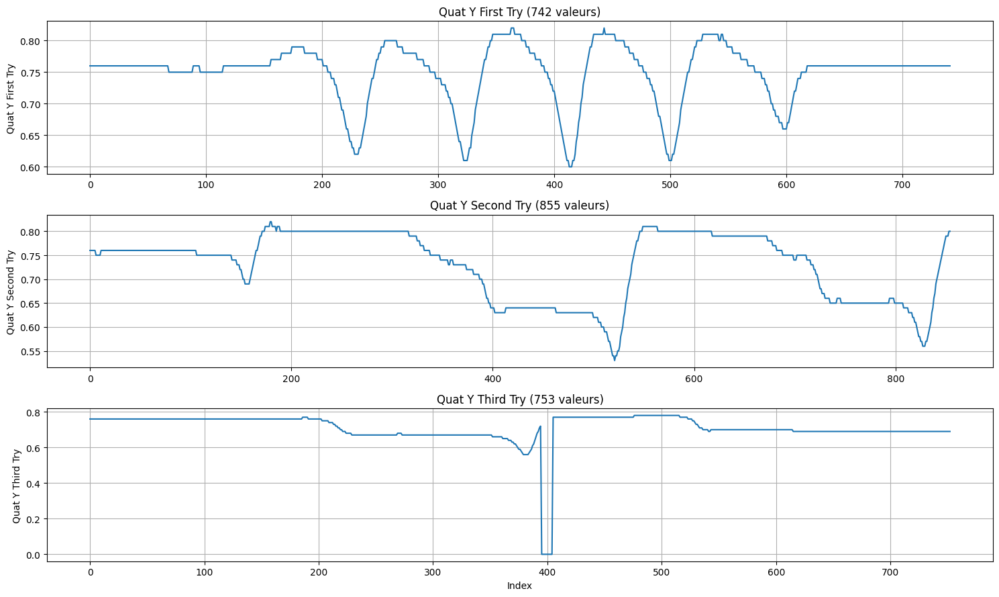

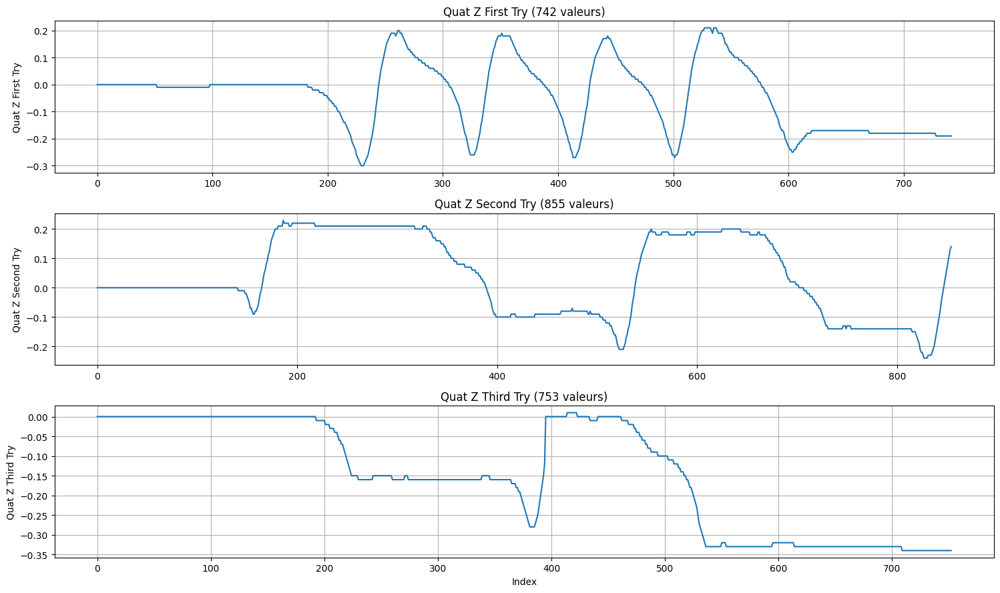

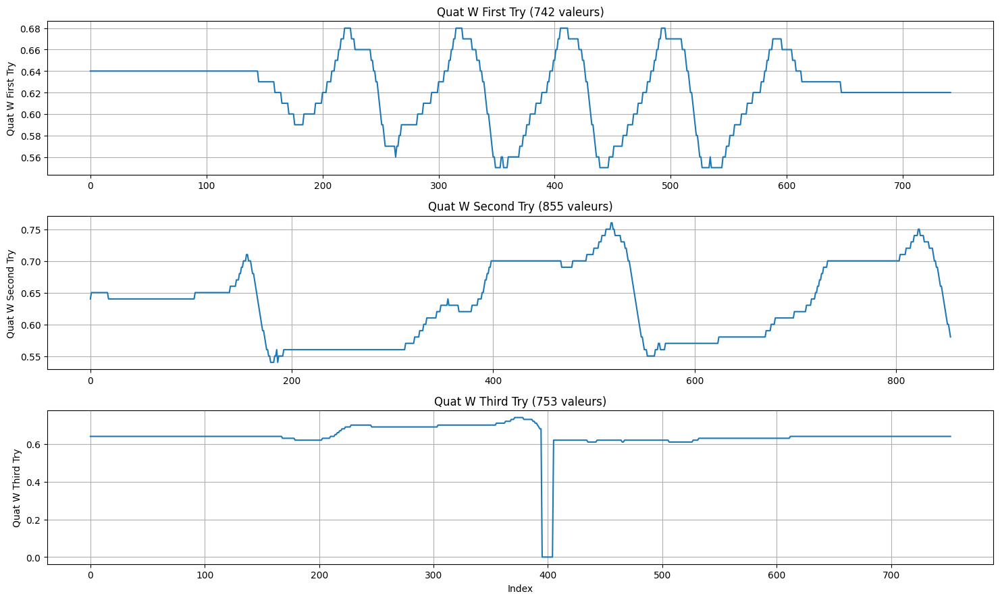

In [50]:
draw_data3(qx1, qx2, qx3, label_x='Quat X First Try', label_y='Quat X Second Try', label_z='Quat X Third Try')
draw_data3(qy1, qy2, qy3, label_x='Quat Y First Try', label_y='Quat Y Second Try', label_z='Quat Y Third Try')
draw_data3(qz1, qz2, qz3, label_x='Quat Z First Try', label_y='Quat Z Second Try', label_z='Quat Z Third Try')
draw_data3(qw1, qw2, qw3, label_x='Quat W First Try', label_y='Quat W Second Try', label_z='Quat W Third Try')

In [51]:
# chemin du fichier CSV
csv_path = "./data/data_5_steps.csv"

# lecture du fichier CSV avec pandas
df = pd.read_csv(csv_path)

# affichage des 5 premières lignes
df.head()

# récupérer les colonnes dans des "arrays" numpy
delta_t = df['delta_t'].to_numpy()
gx = df['gx'].to_numpy()
gy = df['gy'].to_numpy()
gz = df['gz'].to_numpy()
qw = df['qw'].to_numpy()
qx = df['qx'].to_numpy()
qy = df['qy'].to_numpy()
qz = df['qz'].to_numpy()
lin_ax = df['lin_ax'].to_numpy()
lin_ay = df['lin_ay'].to_numpy()
lin_az = df['lin_az'].to_numpy()

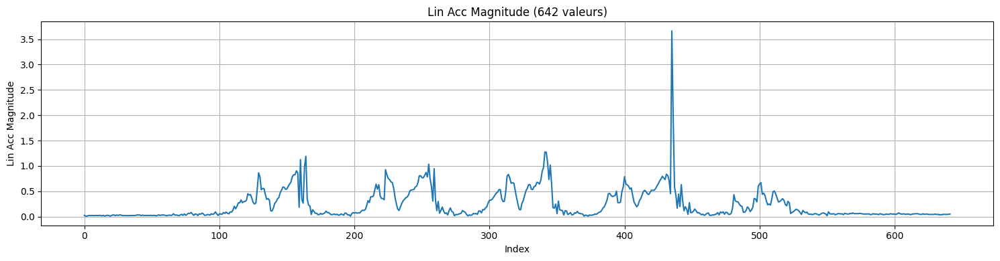

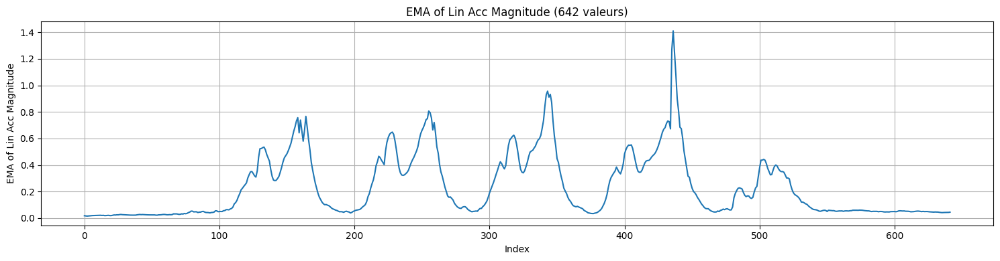

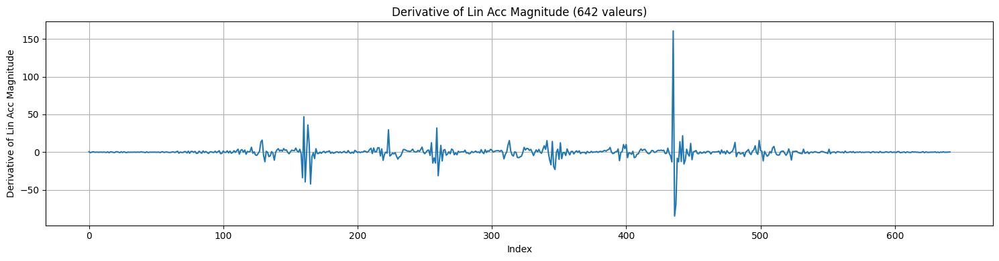

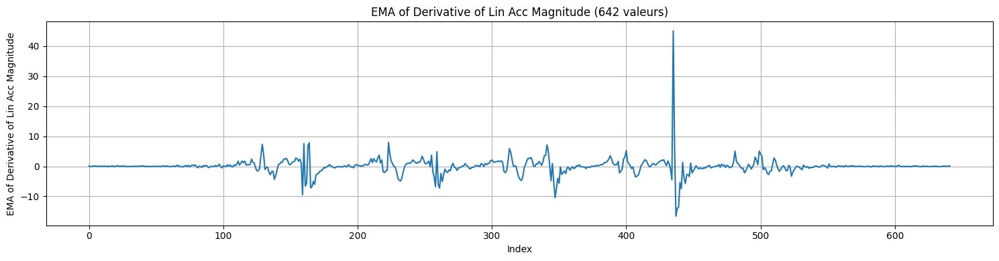

In [ ]:
start = 100
end = len(lin_ax)

acc_magnitude = np.sqrt(lin_ax**2 + lin_ay**2 + lin_az**2)
derivatives = compute_derivatives(acc_magnitude, delta_t)

ema_coeff = 0.2
ema_coeff_deriv = 0.3
# Exemple d'utilisation
ema_acc_mag = compute_ema(acc_magnitude, ema_coeff)
ema_deriv = compute_ema(derivatives, ema_coeff_deriv)

draw_data1(acc_magnitude, label='Lin Acc Magnitude', kind='plot', start=start, end=end)
draw_data1(ema_acc_mag, label='EMA of Lin Acc Magnitude', kind='plot', start=start, end=end)
draw_data1(derivatives, label='Derivative of Lin Acc Magnitude', kind='plot', start=start, end=end)
draw_data1(ema_deriv, label='EMA of Derivative of Lin Acc Magnitude', kind='plot', start=start, end=end)

# traitements sur les angles

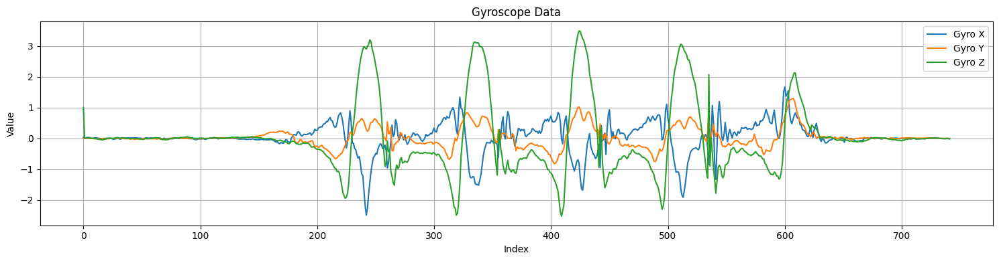

In [ ]:
draw_same_plot(gx, gy, gz, labels=['Gyro X', 'Gyro Y', 'Gyro Z'], title='Gyroscope Data', kind='plot')

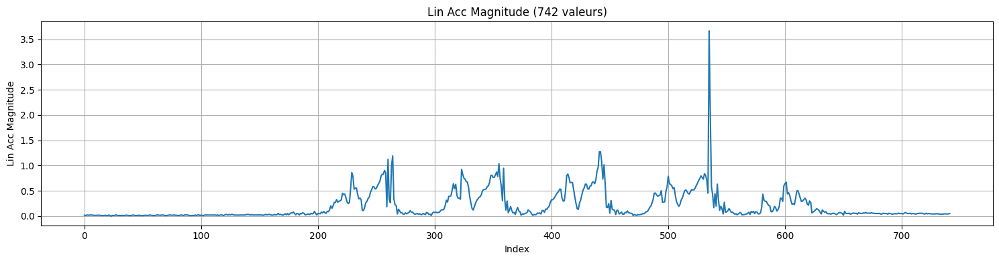

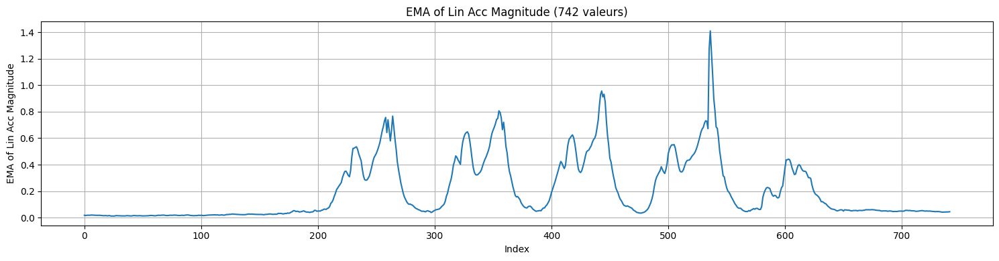

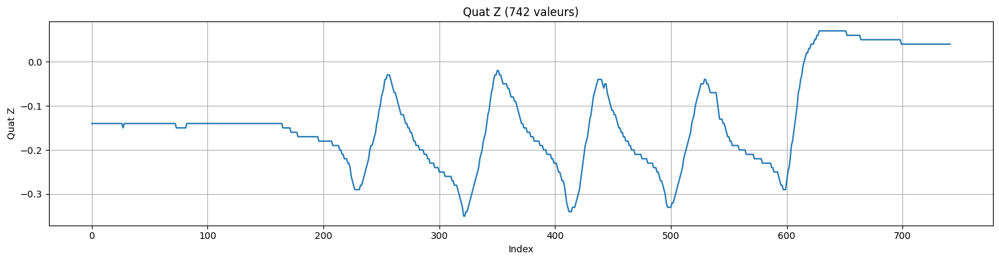

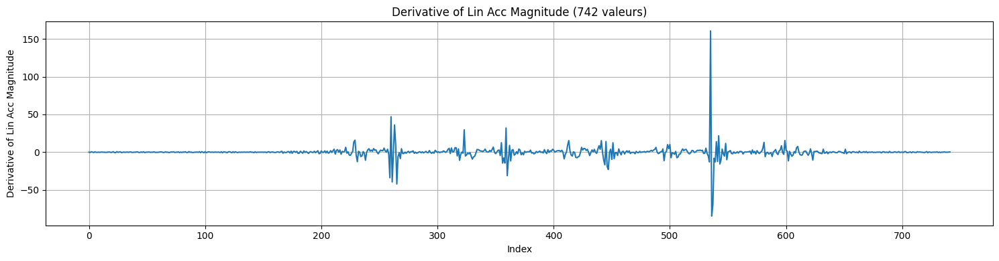

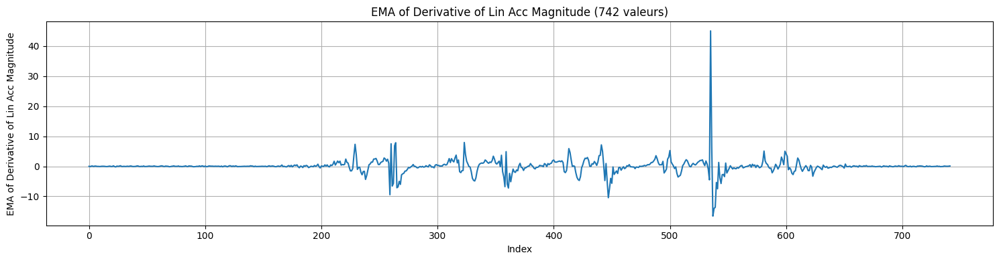

In [83]:
start = 0
end = len(lin_ax)

acc_magnitude = np.sqrt(lin_ax**2 + lin_ay**2 + lin_az**2)
derivatives = compute_derivatives(acc_magnitude, delta_t)

ema_coeff = 0.2
ema_coeff_deriv = 0.3
# Exemple d'utilisation
ema_acc_mag = compute_ema(acc_magnitude, ema_coeff)
ema_deriv = compute_ema(derivatives, ema_coeff_deriv)

draw_data1(acc_magnitude, label='Lin Acc Magnitude', kind='plot', start=start, end=end)
draw_data1(ema_acc_mag, label='EMA of Lin Acc Magnitude', kind='plot', start=start, end=end)
draw_data1(qx, label='Quat Z', kind='plot', start=start, end=end)
draw_data1(derivatives, label='Derivative of Lin Acc Magnitude', kind='plot', start=start, end=end)
draw_data1(ema_deriv, label='EMA of Derivative of Lin Acc Magnitude', kind='plot', start=start, end=end)

In [76]:
start = 100
end = len(lin_ax)

gyro_magnitude = np.sqrt(gx**2 + gy**2 + gz**2)
gyro_derivatives = compute_derivatives(gyro_magnitude, delta_t)

ema_coeff = 0.2
ema_coeff_deriv = 0.3
# Exemple d'utilisation
ema_gyro_mag = compute_ema(gyro_magnitude, ema_coeff)
ema_gyro_deriv = compute_ema(gyro_derivatives, ema_coeff_deriv)

# draw_data1(gyro_magnitude, label='Gyro Magnitude', kind='plot', start=start, end=end)
# draw_data1(ema_gyro_mag, label='EMA of Gyro Magnitude', kind='plot', start=start, end=end)
# draw_data1(gx, label='Gyro X', kind='plot', start=start, end=end)
# draw_data1(gyro_derivatives, label='Derivative of Gyro Magnitude', kind='plot', start=start, end=end)
# draw_data1(ema_gyro_deriv, label='EMA of Derivative of Gyro Magnitude', kind='plot', start=start, end=end)

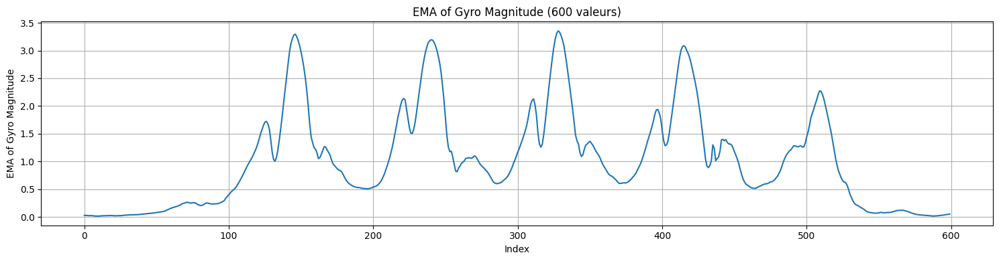

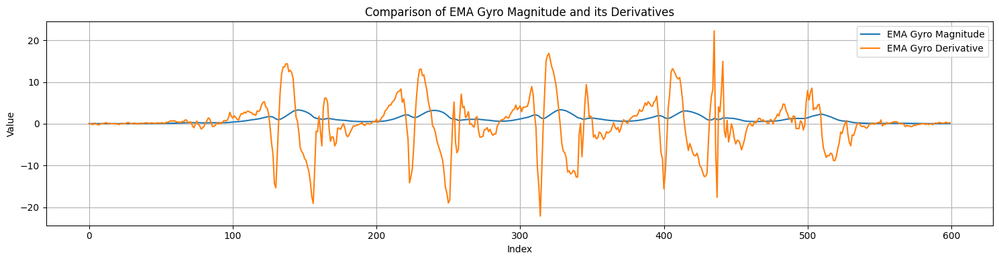

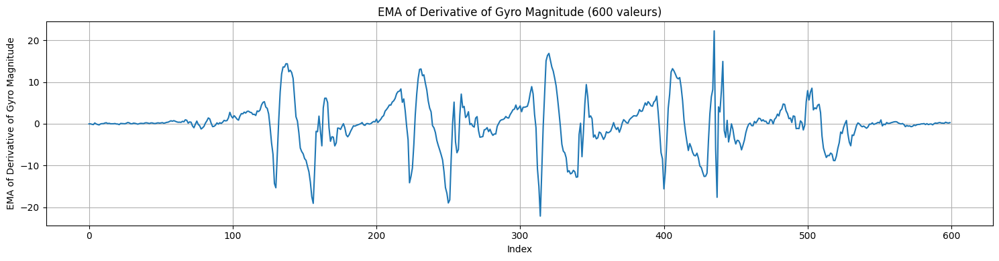

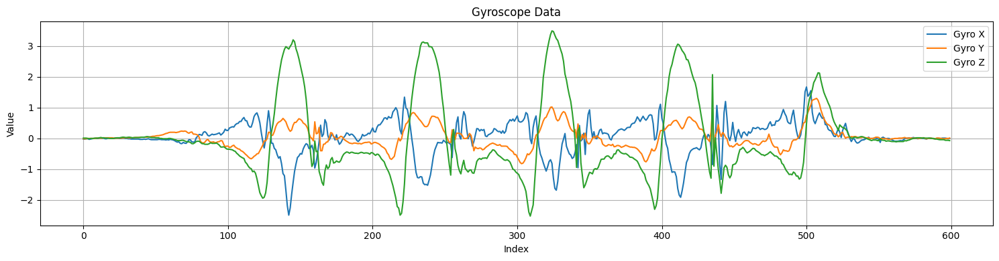

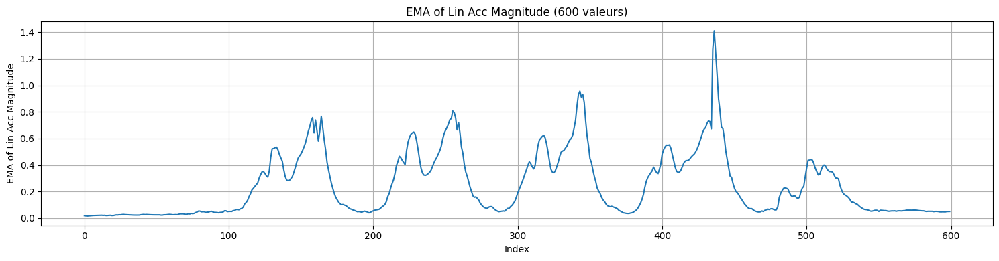

In [85]:
start = 100
end = 700
draw_data1(ema_gyro_mag, label='EMA of Gyro Magnitude', kind='plot', start=start, end=end)
draw_same_plot(ema_gyro_mag, ema_gyro_deriv, labels=['EMA Gyro Magnitude', 'EMA Gyro Derivative'], title='Comparison of EMA Gyro Magnitude and its Derivatives', kind='plot', start=start, end=end)
draw_data1(ema_gyro_deriv, label='EMA of Derivative of Gyro Magnitude', kind='plot', start=start, end=end)
draw_same_plot(gx, gy, gz, labels=['Gyro X', 'Gyro Y', 'Gyro Z'], title='Gyroscope Data', kind='plot', start=start, end=end)
draw_data1(ema_acc_mag, label='EMA of Lin Acc Magnitude', kind='plot', start=start, end=end)

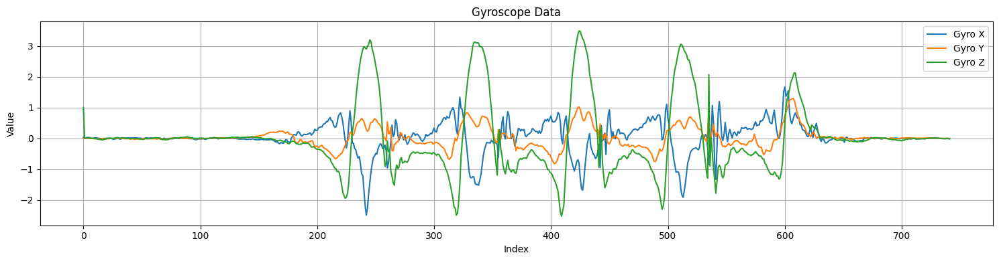

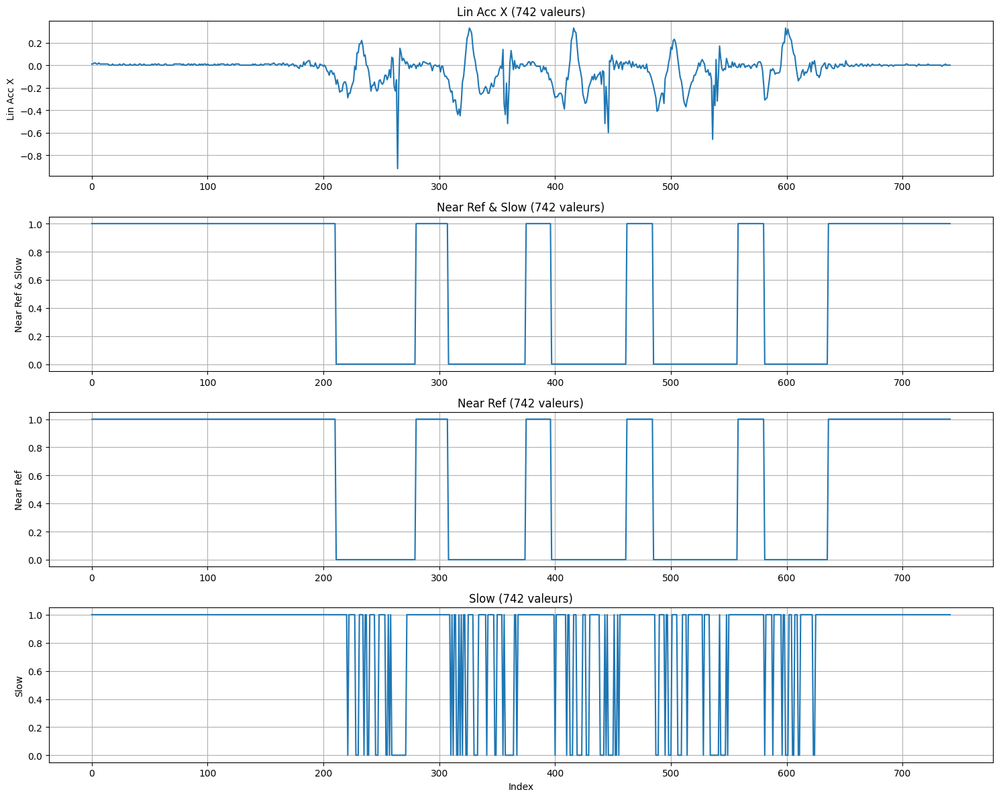

In [89]:
draw_same_plot(gx, gy, gz, labels=['Gyro X', 'Gyro Y', 'Gyro Z'], title='Gyroscope Data', kind='plot')

accMagnitudeTolerance = 0.1
derivAccMagnitudeTolerance = 2

near_ref = np.abs(ema_acc_mag) < accMagnitudeTolerance
slow = np.abs(ema_deriv) < derivAccMagnitudeTolerance

draw_data4(lin_ax, near_ref & slow, near_ref, slow, label_w='Lin Acc X', label_x='Near Ref & Slow', label_y='Near Ref', label_z='Slow', kind='plot')


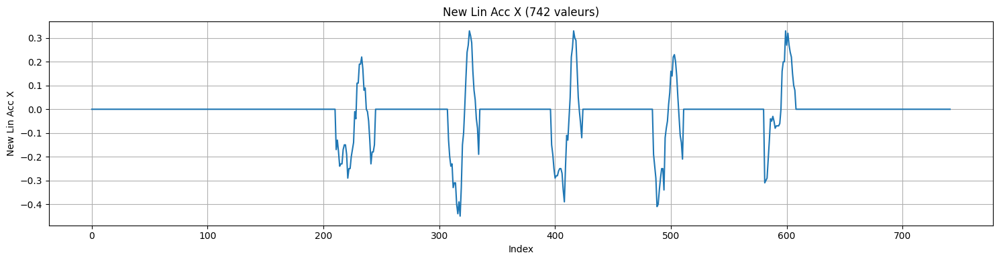

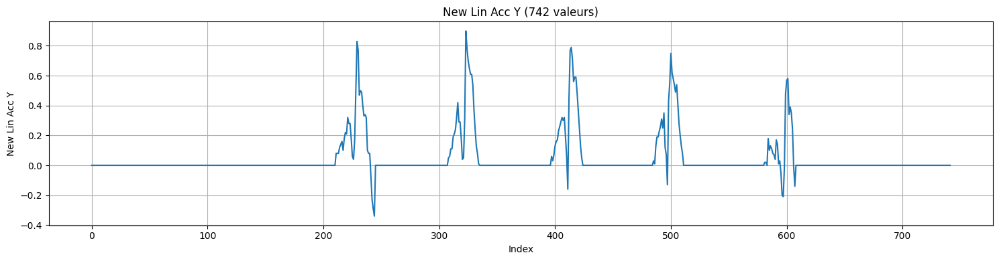

In [90]:
new_ax = np.zeros(len(lin_ax))
new_ay = np.zeros(len(lin_ax))

max = gz[0]
id_max = 0

for i in range(len(lin_ax)):
    
    cond_prev = near_ref[i-1] and slow[i-1]
    cond_now = near_ref[i] and slow[i]

    if cond_prev and not cond_now:
        debut = i
        start = True

        max = gz[i]
        id_max = i

    if start:
        if gz[i] > max:
            max = gz[i]
            id_max = i

    if not cond_prev and cond_now:
        start = False

        fin = id_max
        for j in range(debut, fin):
            new_ax[j] = lin_ax[j]
            new_ay[j] = lin_ay[j]

draw_data1(new_ax, label='New Lin Acc X', kind='plot')
draw_data1(new_ay, label='New Lin Acc Y', kind='plot')
        

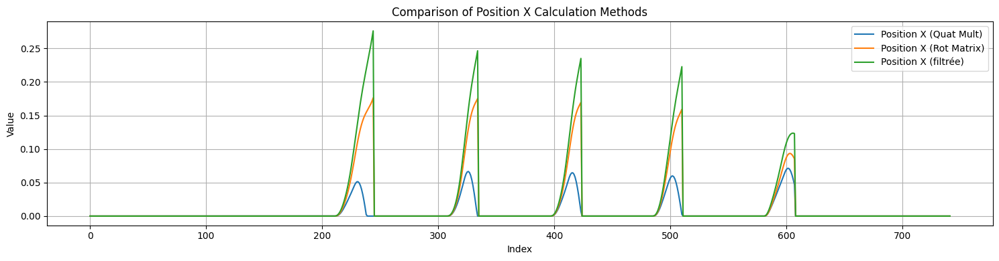

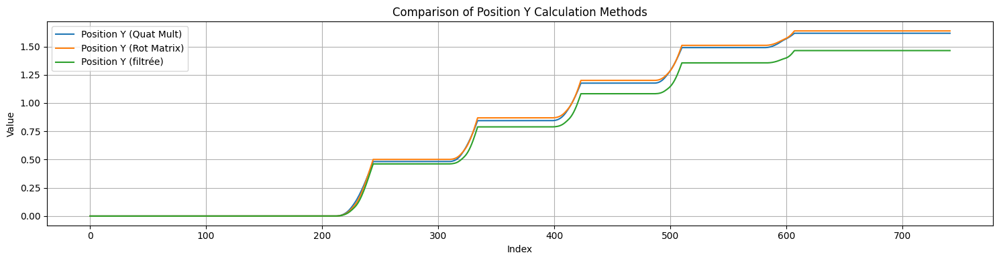

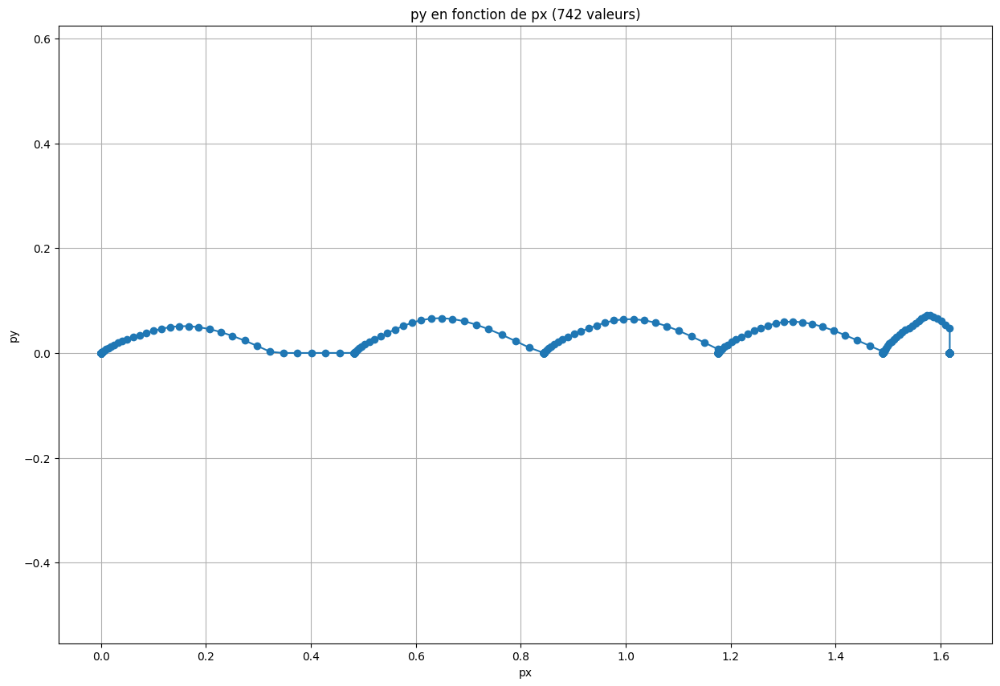

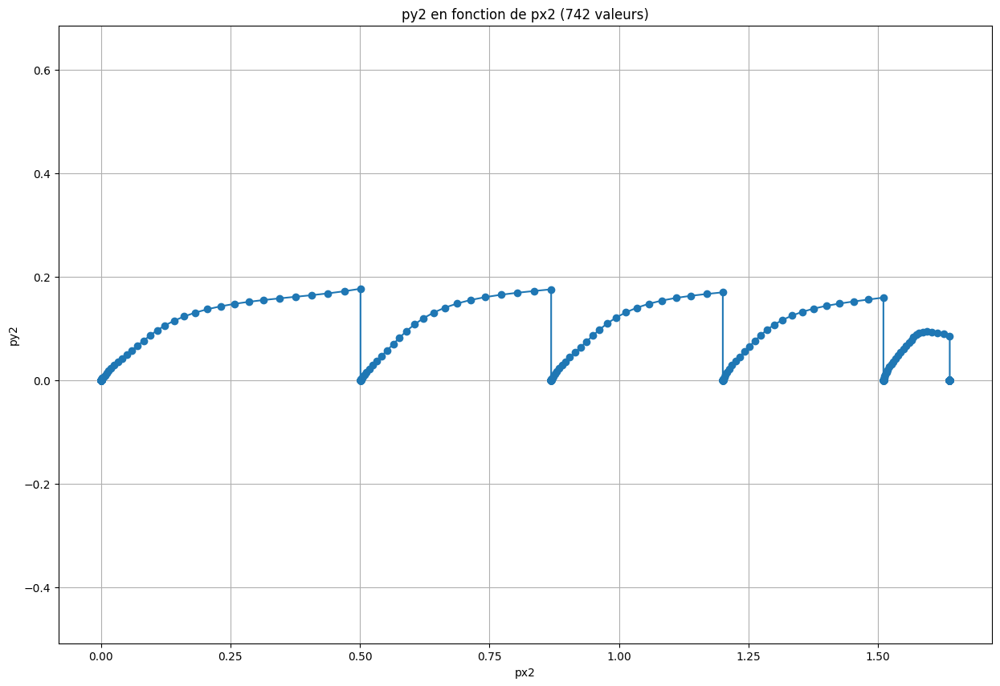

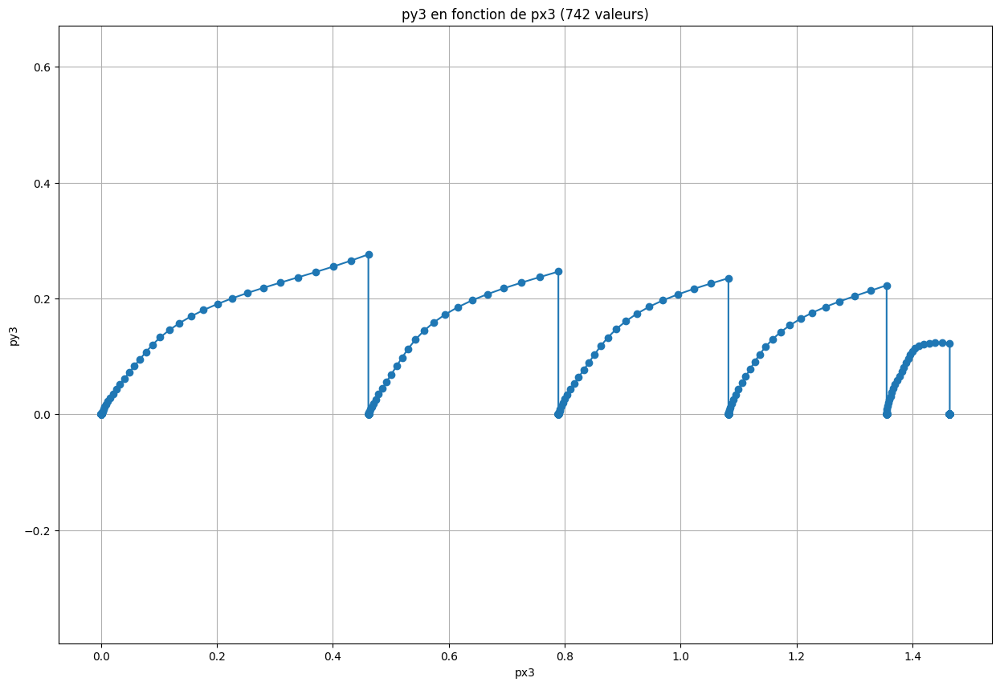

In [106]:
n = len(lin_ax)
new_px = np.zeros(n)
new_py = np.zeros(n)
new_px2 = np.zeros(n)
new_py2 = np.zeros(n)
new_px3 = np.zeros(n)
new_py3 = np.zeros(n)

max = gz[0]
id_max = 0

last_pos = 0
last_pos2 = 0
last_pos3 = 0

for i in range(len(lin_ax)):
    
    cond_prev = near_ref[i-1] and slow[i-1]
    cond_now = near_ref[i] and slow[i]

    if cond_prev and not cond_now:
        debut = i
        start = True

        max = gz[i]
        id_max = i

    if start:
        if gz[i] > max:
            max = gz[i]
            id_max = i

    if not cond_prev and cond_now:
        start = False
        fin = id_max

        ax_i = lin_ax[debut:fin]
        ay_i = lin_ay[debut:fin]
        qw_i = qw[debut:fin]
        qx_i = qx[debut:fin]
        qy_i = qy[debut:fin]
        qz_i = qz[debut:fin]
        dt_i = delta_t[debut:fin]

        ax_filt, ay_filt, _ = low_pass_filter_init(ax_i, ay_i, np.zeros(len(ax_i)), alpha=0.4)

        # changement de ref
        world_ax, world_ay, world_az = cal_acc_world_quat_multo(ax_filt, ay_filt, np.zeros(len(ax_filt)), qw_i, qx_i, qy_i, qz_i)
        world2_ax, world2_ay, world2_az = cal_acc_world_rot_matrix(ax_filt, ay_filt, np.zeros(len(ax_filt)), qw_i, qx_i, qy_i, qz_i)
        world3_ax, world3_ay, world3_az = ax_filt, ay_filt, np.zeros(len(ax_filt))

        world_ax = -world_az
        world2_ax = world2_az

        # conversion en m/s²
        world_ax, world_ay = world_ax * 9.81, world_ay * 9.81
        world2_ax, world2_ay = world2_ax * 9.81, world2_ay * 9.81
        world3_ax, world3_ay = world3_ax * 9.81, world3_ay * 9.81

        # calcul de la vitesse
        vx, vy, _ = trapezoidal_integration(world_ax, world_ay, np.zeros(len(world_ax)), dt_i).T
        vx2, vy2, _ = trapezoidal_integration(world2_ax, world2_ay, np.zeros(len(world2_ax)), dt_i).T
        vx3, vy3, _ = trapezoidal_integration(world3_ax, world3_ay, np.zeros(len(world3_ax)), dt_i).T

        # calcul de la position
        px, py, _ = trapezoidal_integration(vx, vy, np.zeros(len(vx)), dt_i).T
        px2, py2, _ = trapezoidal_integration(vx2, vy2, np.zeros(len(vx2)), dt_i).T
        px3, py3, _ = trapezoidal_integration(vx3, vy3, np.zeros(len(vx3)), dt_i).T

        # remettre axe x en place
        px = np.where(px > 0, 0, -px)
        px2 = np.where(px2 > 0, 0, -px2)
        px3 = np.where(px3 > 0, 0, -px3)

        # ajustement de la position pour éviter les sauts
        # px += last_pos
        # px2 += last_pos2
        # px3 += last_pos3

        # last_pos = px[-1]
        # last_pos2 = px2[-1]
        # last_pos3 = px3[-1]

        py += last_pos
        py2 += last_pos2
        py3 += last_pos3

        last_pos = py[-1]
        last_pos2 = py2[-1]
        last_pos3 = py3[-1]

        #
        new_px[debut:fin] = px
        new_py[debut:fin] = py
        new_px2[debut:fin] = px2
        new_py2[debut:fin] = py2
        new_px3[debut:fin] = px3
        new_py3[debut:fin] = py3

        #
        new_py[fin:]=last_pos
        new_py2[fin:]=last_pos2
        new_py3[fin:]=last_pos3



draw_same_plot(new_px, new_px2, new_px3, labels=['Position X (Quat Mult)', 'Position X (Rot Matrix)', 'Position X (filtrée)'], title='Comparison of Position X Calculation Methods', kind='plot')
draw_same_plot(new_py, new_py2, new_py3, labels=['Position Y (Quat Mult)', 'Position Y (Rot Matrix)', 'Position Y (filtrée)'], title='Comparison of Position Y Calculation Methods', kind='plot')

compare_data(new_py, new_px, xlabel='px', ylabel='py', kind='plot')
compare_data(new_py2, new_px2, xlabel='px2', ylabel='py2', kind='plot')
compare_data(new_py3, new_px3, xlabel='px3', ylabel='py3', kind='plot')

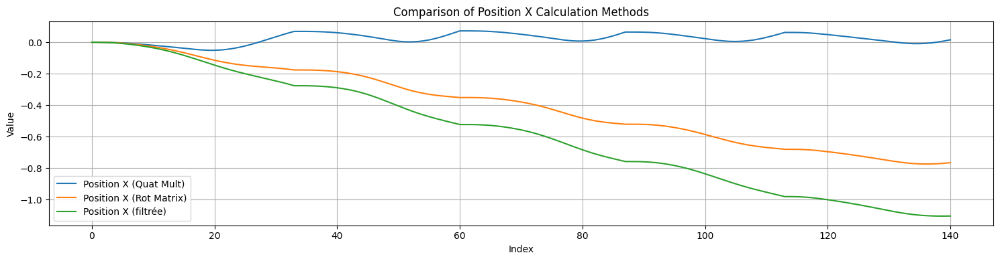

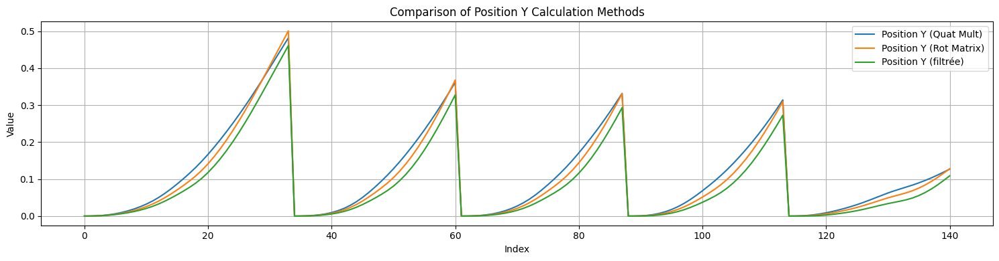

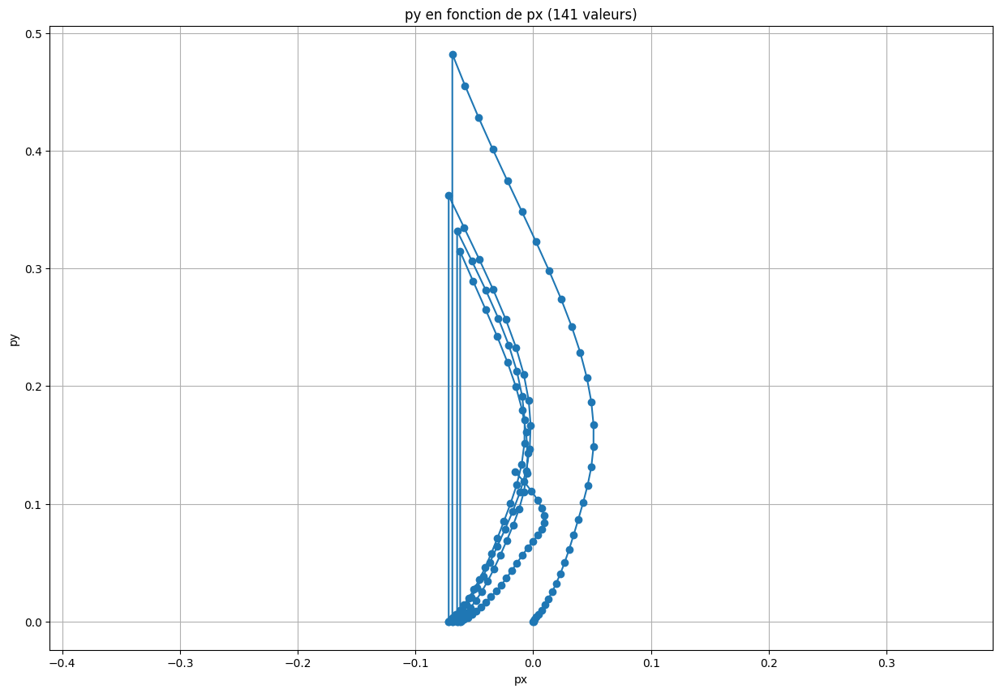

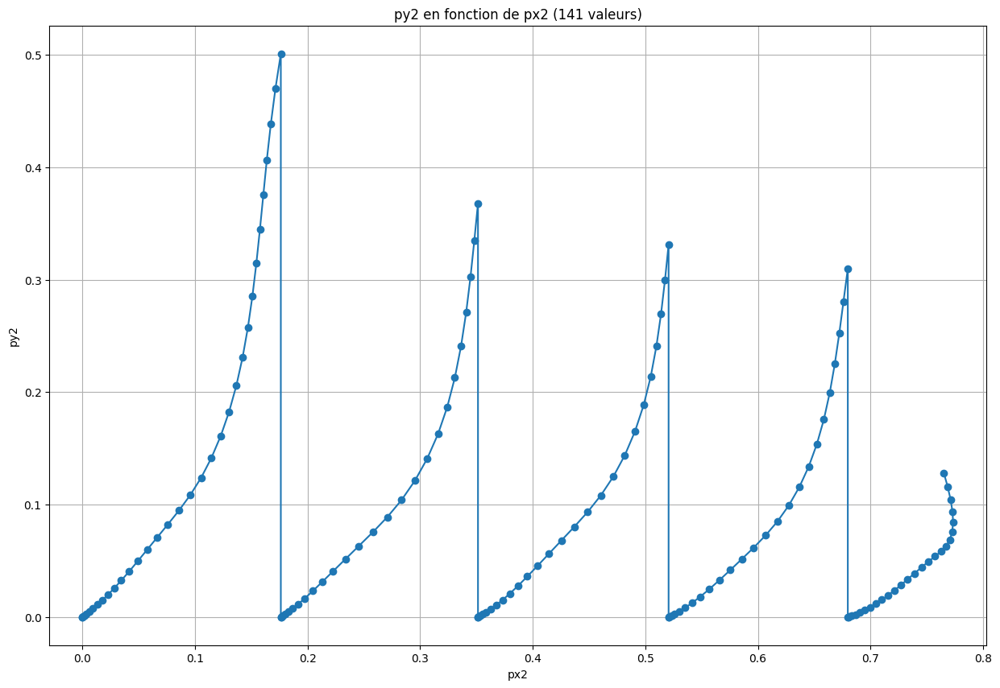

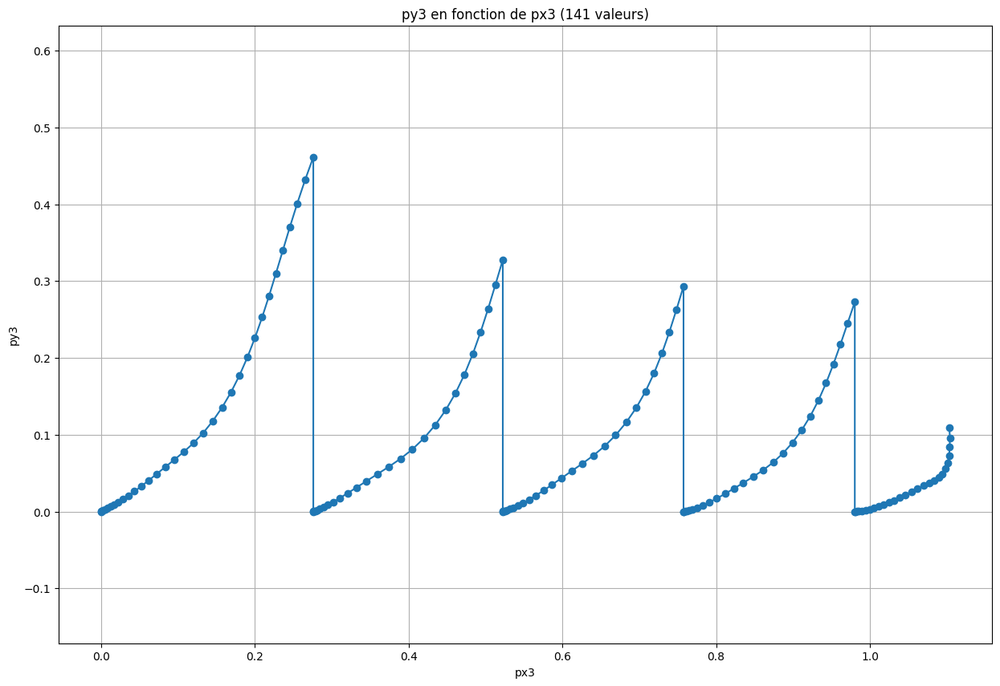

In [103]:
new_px = np.array([])
new_py = np.array([])
new_px2 = np.array([])
new_py2 = np.array([])
new_px3 = np.array([])
new_py3 = np.array([])

max = gz[0]
id_max = 0

last_pos = 0
last_pos2 = 0
last_pos3 = 0

for i in range(len(lin_ax)):
    
    cond_prev = near_ref[i-1] and slow[i-1]
    cond_now = near_ref[i] and slow[i]

    if cond_prev and not cond_now:
        debut = i
        start = True

        max = gz[i]
        id_max = i

    if start:
        if gz[i] > max:
            max = gz[i]
            id_max = i

    if not cond_prev and cond_now:
        start = False
        fin = id_max

        ax_i = lin_ax[debut:fin]
        ay_i = lin_ay[debut:fin]
        qw_i = qw[debut:fin]
        qx_i = qx[debut:fin]
        qy_i = qy[debut:fin]
        qz_i = qz[debut:fin]
        dt_i = delta_t[debut:fin]

        ax_filt, ay_filt, _ = low_pass_filter_init(ax_i, ay_i, np.zeros(len(ax_i)), alpha=0.4)

        # changement de ref
        world_ax, world_ay, world_az = cal_acc_world_quat_multo(ax_filt, ay_filt, np.zeros(len(ax_filt)), qw_i, qx_i, qy_i, qz_i)
        world2_ax, world2_ay, world2_az = cal_acc_world_rot_matrix(ax_filt, ay_filt, np.zeros(len(ax_filt)), qw_i, qx_i, qy_i, qz_i)
        world3_ax, world3_ay, world3_az = ax_filt, ay_filt, np.zeros(len(ax_filt))

        world_ax = -world_az
        world2_ax = world2_az

        # conversion en m/s²
        world_ax, world_ay = world_ax * 9.81, world_ay * 9.81
        world2_ax, world2_ay = world2_ax * 9.81, world2_ay * 9.81
        world3_ax, world3_ay = world3_ax * 9.81, world3_ay * 9.81

        # calcul de la vitesse
        vx, vy, _ = trapezoidal_integration(world_ax, world_ay, np.zeros(len(world_ax)), dt_i).T
        vx2, vy2, _ = trapezoidal_integration(world2_ax, world2_ay, np.zeros(len(world2_ax)), dt_i).T
        vx3, vy3, _ = trapezoidal_integration(world3_ax, world3_ay, np.zeros(len(world3_ax)), dt_i).T

        # calcul de la position
        px, py, _ = trapezoidal_integration(vx, vy, np.zeros(len(vx)), dt_i).T
        px2, py2, _ = trapezoidal_integration(vx2, vy2, np.zeros(len(vx2)), dt_i).T
        px3, py3, _ = trapezoidal_integration(vx3, vy3, np.zeros(len(vx3)), dt_i).T

        # remettre axe x en place
        # px = np.where(px > 0, 0, -px)
        # px2 = np.where(px2 > 0, 0, -px2)
        # px3 = np.where(px3 > 0, 0, -px3)

        # ajustement de la position pour éviter les sauts
        px += last_pos
        px2 += last_pos2
        px3 += last_pos3

        last_pos = px[-1]
        last_pos2 = px2[-1]
        last_pos3 = px3[-1]

        # py += last_pos
        # py2 += last_pos2
        # py3 += last_pos3

        # last_pos = py[-1]
        # last_pos2 = py2[-1]
        # last_pos3 = py3[-1]

        #
        new_px = np.concatenate([new_px, px])
        new_py = np.concatenate([new_py, py])
        new_px2 = np.concatenate([new_px2, px2])
        new_py2 = np.concatenate([new_py2, py2])
        new_px3 = np.concatenate([new_px3, px3])
        new_py3 = np.concatenate([new_py3, py3])


draw_same_plot(new_px, new_px2, new_px3, labels=['Position X (Quat Mult)', 'Position X (Rot Matrix)', 'Position X (filtrée)'], title='Comparison of Position X Calculation Methods', kind='plot')
draw_same_plot(new_py, new_py2, new_py3, labels=['Position Y (Quat Mult)', 'Position Y (Rot Matrix)', 'Position Y (filtrée)'], title='Comparison of Position Y Calculation Methods', kind='plot')

compare_data(-new_px, new_py, xlabel='px', ylabel='py', kind='plot')
compare_data(-new_px2, new_py2, xlabel='px2', ylabel='py2', kind='plot')
compare_data(-new_px3, new_py3, xlabel='px3', ylabel='py3', kind='plot')

# 1 min dataS

In [112]:
# chemin du fichier CSV
csv_path = "./data/data_3min.csv"

# lecture du fichier CSV avec pandas
df = pd.read_csv(csv_path)

# affichage des 5 premières lignes
df.head()

# récupérer les colonnes dans des "arrays" numpy
delta_t = df['delta_t'].to_numpy()
gx = df['gx'].to_numpy()
gy = df['gy'].to_numpy()
gz = df['gz'].to_numpy()
qw = df['qw'].to_numpy()
qx = df['qx'].to_numpy()
qy = df['qy'].to_numpy()
qz = df['qz'].to_numpy()
lin_ax = df['lin_ax'].to_numpy()
lin_ay = df['lin_ay'].to_numpy()
lin_az = df['lin_az'].to_numpy()

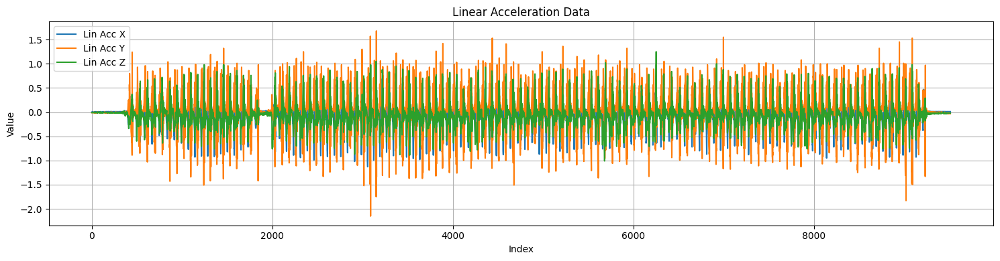

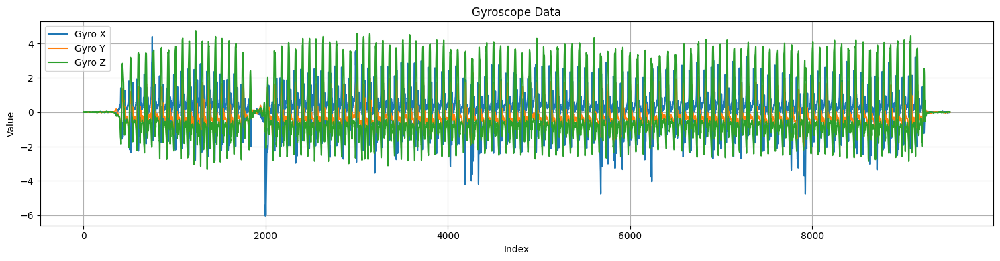

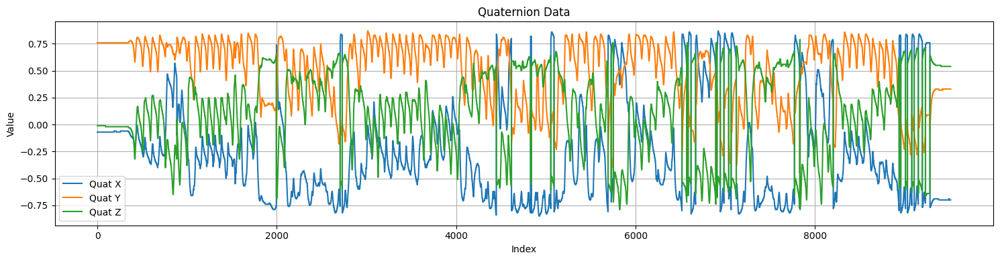

In [113]:
start = 0
end = len(lin_ax)
draw_same_plot(lin_ax, lin_ay, lin_az, labels=['Lin Acc X', 'Lin Acc Y', 'Lin Acc Z'], title='Linear Acceleration Data', kind='plot', start=start, end=end)
draw_same_plot(gx, gy, gz, labels=['Gyro X', 'Gyro Y', 'Gyro Z'], title='Gyroscope Data', kind='plot', start=start, end=end)
draw_same_plot(qx, qy, qz, labels=['Quat X', 'Quat Y', 'Quat Z'], title='Quaternion Data', kind='plot', start=start, end=end)

In [114]:
acc_magnitude = np.sqrt(lin_ax**2 + lin_ay**2 + lin_az**2)
derivatives = compute_derivatives(acc_magnitude, delta_t)

ema_coeff = 0.2
ema_coeff_deriv = 0.3
# Exemple d'utilisation
ema_acc_mag = compute_ema(acc_magnitude, ema_coeff)
ema_deriv = compute_ema(derivatives, ema_coeff_deriv)

accMagnitudeTolerance = 0.1
derivAccMagnitudeTolerance = 2

near_ref = np.abs(ema_acc_mag) < accMagnitudeTolerance
slow = np.abs(ema_deriv) < derivAccMagnitudeTolerance

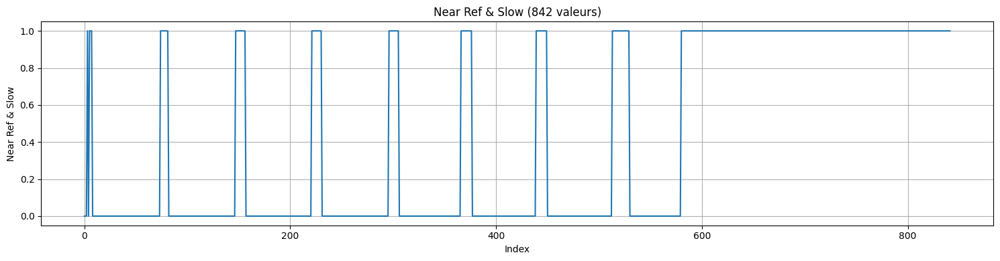

In [120]:
start = 8670 
end = len(lin_ax)
draw_data1(near_ref& slow, label='Near Ref & Slow', kind='plot', start=start, end=end)

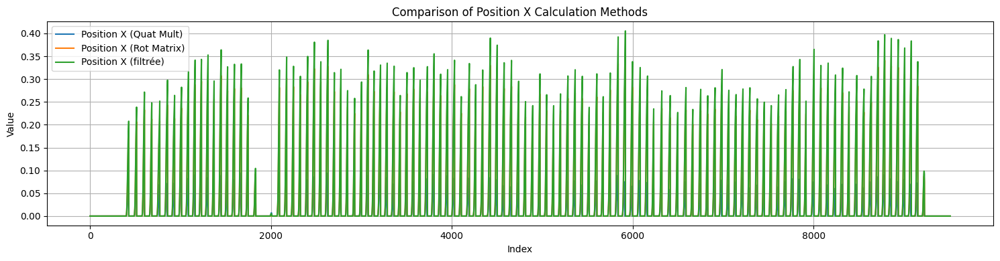

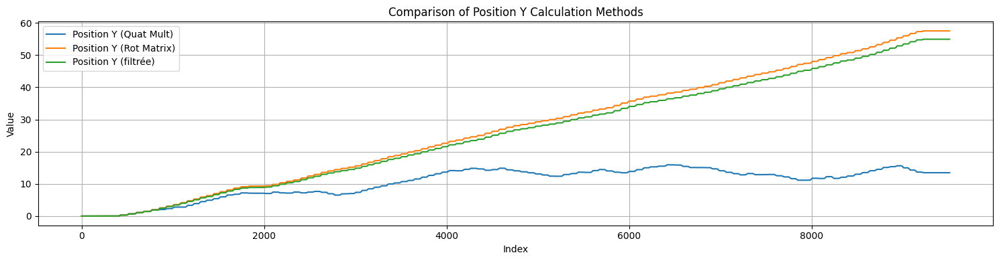

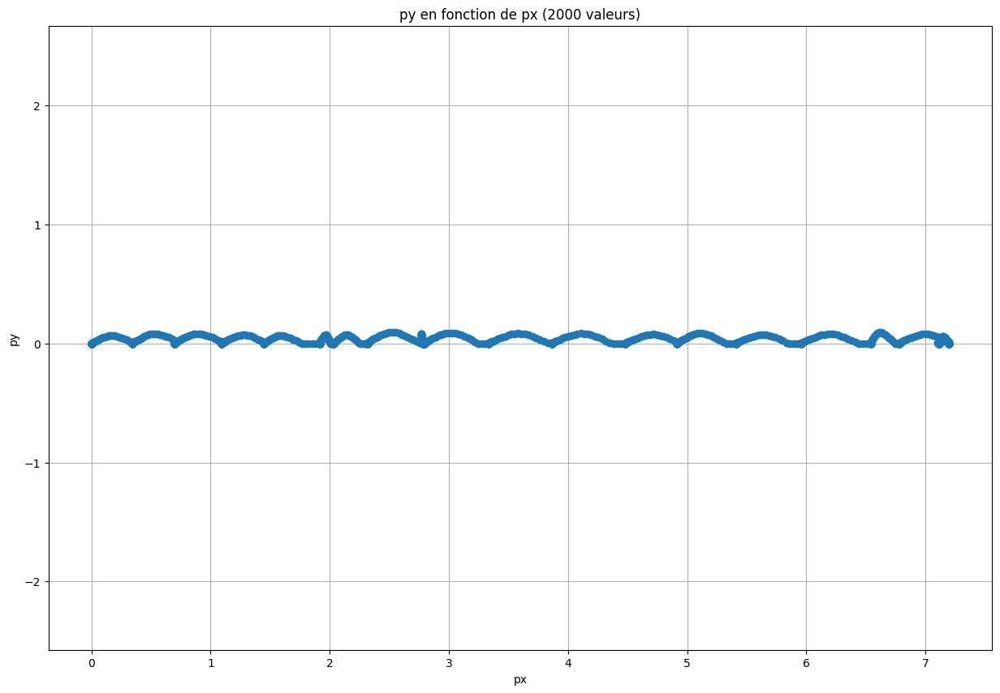

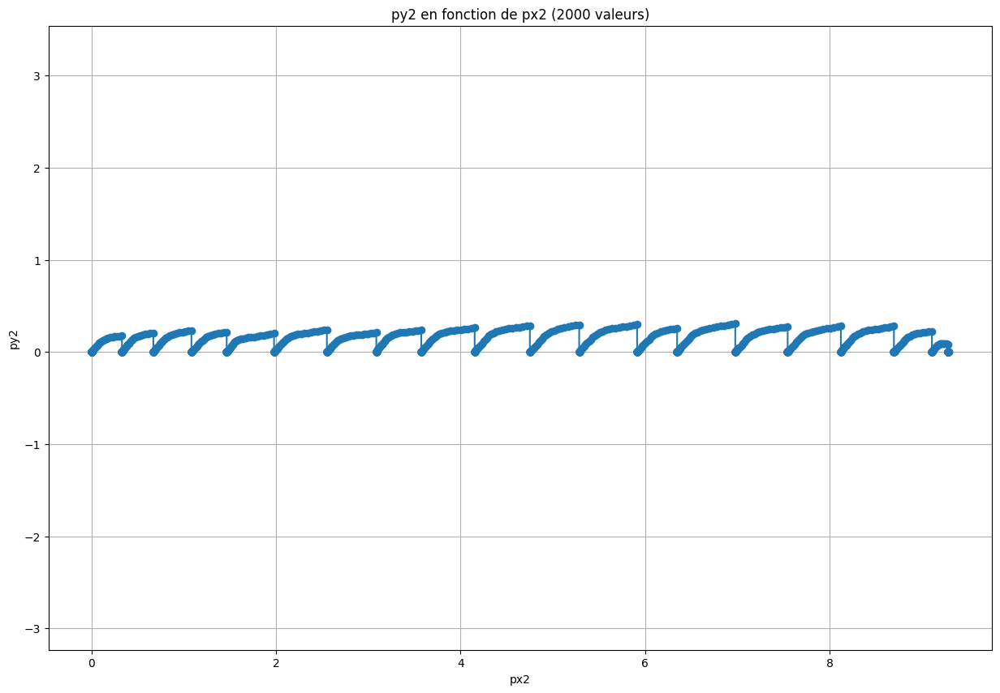

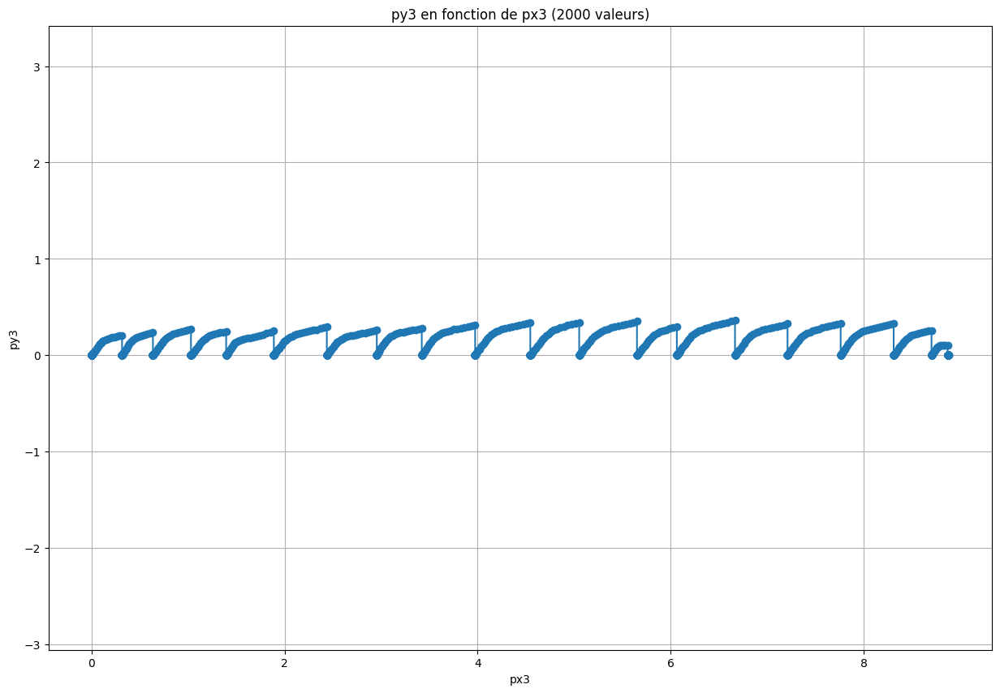

In [122]:
n = len(lin_ax)
new_px = np.zeros(n)
new_py = np.zeros(n)
new_px2 = np.zeros(n)
new_py2 = np.zeros(n)
new_px3 = np.zeros(n)
new_py3 = np.zeros(n)

max = gz[0]
id_max = 0

last_pos = 0
last_pos2 = 0
last_pos3 = 0

for i in range(len(lin_ax)):
    
    cond_prev = near_ref[i-1] and slow[i-1]
    cond_now = near_ref[i] and slow[i]

    if cond_prev and not cond_now:
        debut = i
        start = True

        max = gz[i]
        id_max = i

    if start:
        if gz[i] > max:
            max = gz[i]
            id_max = i

    if not cond_prev and cond_now:
        start = False
        fin = id_max

        if fin - debut >0:

            ax_i = lin_ax[debut:fin]
            ay_i = lin_ay[debut:fin]
            qw_i = qw[debut:fin]
            qx_i = qx[debut:fin]
            qy_i = qy[debut:fin]
            qz_i = qz[debut:fin]
            dt_i = delta_t[debut:fin]

            

            ax_filt, ay_filt, _ = low_pass_filter_init(ax_i, ay_i, np.zeros(len(ax_i)), alpha=0.4)

            # changement de ref
            world_ax, world_ay, world_az = cal_acc_world_quat_multo(ax_filt, ay_filt, np.zeros(len(ax_filt)), qw_i, qx_i, qy_i, qz_i)
            world2_ax, world2_ay, world2_az = cal_acc_world_rot_matrix(ax_filt, ay_filt, np.zeros(len(ax_filt)), qw_i, qx_i, qy_i, qz_i)
            world3_ax, world3_ay, world3_az = ax_filt, ay_filt, np.zeros(len(ax_filt))

            world_ax = -world_az
            world2_ax = world2_az

            # conversion en m/s²
            world_ax, world_ay = world_ax * 9.81, world_ay * 9.81
            world2_ax, world2_ay = world2_ax * 9.81, world2_ay * 9.81
            world3_ax, world3_ay = world3_ax * 9.81, world3_ay * 9.81

            # calcul de la vitesse
            vx, vy, _ = trapezoidal_integration(world_ax, world_ay, np.zeros(len(world_ax)), dt_i).T
            vx2, vy2, _ = trapezoidal_integration(world2_ax, world2_ay, np.zeros(len(world2_ax)), dt_i).T
            vx3, vy3, _ = trapezoidal_integration(world3_ax, world3_ay, np.zeros(len(world3_ax)), dt_i).T

            # calcul de la position
            px, py, _ = trapezoidal_integration(vx, vy, np.zeros(len(vx)), dt_i).T
            px2, py2, _ = trapezoidal_integration(vx2, vy2, np.zeros(len(vx2)), dt_i).T
            px3, py3, _ = trapezoidal_integration(vx3, vy3, np.zeros(len(vx3)), dt_i).T

            # remettre axe x en place
            px = np.where(px > 0, 0, -px)
            px2 = np.where(px2 > 0, 0, -px2)
            px3 = np.where(px3 > 0, 0, -px3)

            # ajustement de la position pour éviter les sauts
            # px += last_pos
            # px2 += last_pos2
            # px3 += last_pos3

            # last_pos = px[-1]
            # last_pos2 = px2[-1]
            # last_pos3 = px3[-1]

            py += last_pos
            py2 += last_pos2
            py3 += last_pos3

            last_pos = py[-1]
            last_pos2 = py2[-1]
            last_pos3 = py3[-1]

            #
            new_px[debut:fin] = px
            new_py[debut:fin] = py
            new_px2[debut:fin] = px2
            new_py2[debut:fin] = py2
            new_px3[debut:fin] = px3
            new_py3[debut:fin] = py3

            #
            new_py[fin:]=last_pos
            new_py2[fin:]=last_pos2
            new_py3[fin:]=last_pos3



draw_same_plot(new_px, new_px2, new_px3, labels=['Position X (Quat Mult)', 'Position X (Rot Matrix)', 'Position X (filtrée)'], title='Comparison of Position X Calculation Methods', kind='plot')
draw_same_plot(new_py, new_py2, new_py3, labels=['Position Y (Quat Mult)', 'Position Y (Rot Matrix)', 'Position Y (filtrée)'], title='Comparison of Position Y Calculation Methods', kind='plot')

start = 0
end = 2000
compare_data(new_py, new_px, xlabel='px', ylabel='py', kind='plot', start=start, end=end)
compare_data(new_py2, new_px2, xlabel='px2', ylabel='py2', kind='plot', start=start, end=end)
compare_data(new_py3, new_px3, xlabel='px3', ylabel='py3', kind='plot', start=start, end=end)

# fin